## **Import Libraries**

In [1]:
! pip install --upgrade ultralytics -qq

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 24.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 102.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 85.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 62.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 42.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 19.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 105.3 MB/s eta 0:00:00


In [2]:
import os
import re
import glob
import random
import yaml
import sys
import torch
import time
import psutil
import json

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import seaborn as sns

from PIL import Image as PILImage
from IPython.display import Image as IPyImage, display
import cv2
import ultralytics
from ultralytics import YOLO

import threading
import subprocess
import csv
from datetime import datetime

from pathlib import Path

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


## **Custom Functions**

In [3]:
### read yaml file created
def read_yaml_file(file_path):
    with open(file_path, 'r') as file:
        try:
            data = yaml.safe_load(file)
            return data
        except yaml.YAMLError as e:
            print("Error reading YAML:", e)
            return None

### print it with newlines
def print_yaml_data(data):
    formatted_yaml = yaml.dump(data, default_style=False)
    print(formatted_yaml)

In [4]:
#Function to displaying one image
"""
def display_image(image, print_info = True, hide_axis = False):
    if isinstance(image, str):  # Check if it's a file path
        img = Image.open(image)
        plt.imshow(img)
    elif isinstance(image, np.ndarray):  # Check if it's a NumPy array
        image = image[..., ::-1]  # BGR to RGB
        img = Image.fromarray(image)
        plt.imshow(img)
    else:
        raise ValueError("Unsupported image format")
    if print_info:
        print('Type: ', type(img), '\n')
        print('Shape: ', np.array(img).shape, '\n')
    if hide_axis:
        plt.axis('off')
    plt.show()
"""
def display_image(image, print_info=True, hide_axis=False):
    if isinstance(image, str):  # Check if it's a file path
        img = PILImage.open(image)
        plt.imshow(img)
    elif isinstance(image, np.ndarray):  # Check if it's a NumPy array
        plt.imshow(image)
    else:
        raise ValueError("Unsupported image format.")

    if print_info:
        print("Image shape:", np.array(img).shape if isinstance(image, str) else image.shape)

    if hide_axis:
        plt.axis('off')

    plt.show()

#Function to displaying multiple images
"""
def plot_random_images_from_folder(folder_path, num_images=20, seed = None):
    random.seed(seed)
    # Get a list of image files in the folder
    image_files = [f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg', '.gif'))]
    # Ensure that we have at least num_images files to choose from
    if len(image_files) < num_images:
        raise ValueError("Not enough images in the folder")
    # Randomly select num_images image files
    selected_files = random.sample(image_files, num_images)
    # Create a subplot grid
    num_cols = 5
    num_rows = (num_images + num_cols - 1) // num_cols
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 8))
    for i, file_name in enumerate(selected_files):
        # Open and display the image using PIL
        img = Image.open(os.path.join(folder_path, file_name))
        if num_rows == 1:
            ax = axes[i % num_cols]
        else:
            ax = axes[i // num_cols, i % num_cols]
        ax.imshow(img)
        ax.axis('off')
        # ax.set_title(file_name)
  """
def plot_random_images_from_folder(folder_path, num_images=20, seed=None):
    random.seed(seed)
    # Get a list of image files in the folder
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.png', '.jpeg', '.gif'))]

    # Ensure that we have at least num_images files to choose from
    if len(image_files) < num_images:
        raise ValueError("Not enough images in the folder")

    # Randomly select num_images image files
    selected_files = random.sample(image_files, num_images)

    # Create a subplot grid
    num_cols = 5
    num_rows = (num_images + num_cols - 1) // num_cols
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 3 * num_rows))

    # Flatten axes array for easy indexing
    axes = axes.flatten()

    for i, file_name in enumerate(selected_files):
        img_path = os.path.join(folder_path, file_name)
        img = PILImage.open(img_path)
        axes[i].imshow(img)
        axes[i].axis('off')
        axes[i].set_title(file_name, fontsize=8)

    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

    # Remove empty subplots
    for i in range(num_images, num_rows * num_cols):
        if num_rows == 1:
            fig.delaxes(axes[i % num_cols])
        else:
            fig.delaxes(axes[i // num_cols, i % num_cols])
    plt.tight_layout()
    plt.show()

#Function to Retrieve Image Properties
def get_image_properties(image_path):
    # Read the image file
    img = cv2.imread(image_path)
    # Check if the image file is read successfully
    if img is None:
        raise ValueError("Could not read image file")
    # Get image properties
    properties = {
        "width": img.shape[1],
        "height": img.shape[0],
        "channels": img.shape[2] if len(img.shape) == 3 else 1,
        "dtype": img.dtype,
    }
    return properties

In [5]:
#Retrieving Image Properties
def get_image_properties(image_path):
    # Read the image file
    img = cv2.imread(image_path)

    # Check if the image file is read successfully
    if img is None:
        raise ValueError("Could not read image file")

    # Get image properties
    properties = {
        "width": img.shape[1],
        "height": img.shape[0],
        "channels": img.shape[2] if len(img.shape) == 3 else 1,
        "dtype": img.dtype,
    }

    return properties

In [6]:
def log_gpu_usage_to_csv(stop_event, interval=0.5, csv_filename='gpu_usage_log.csv'):
    """
    Logs GPU usage (utilization and memory) to a CSV file until the stop_event is set.
    """
    print(f"🔍 Logging GPU usage every {interval}s...")

    with open(csv_filename, mode='w', newline='') as csvfile:
        writer = csv.writer(csvfile)
        writer.writerow(["Timestamp", "GPU Utilization (%)", "Memory Usage (MB)"])

        while not stop_event.is_set():  # Keep logging until the stop_event is set
            output = subprocess.check_output(
                ['nvidia-smi', '--query-gpu=utilization.gpu,memory.used', '--format=csv,noheader,nounits']
            )
            gpu_util, mem_used = output.decode().strip().split(', ')
            writer.writerow([datetime.now().isoformat(), gpu_util, mem_used])
            time.sleep(interval)

    print(f"✅ Done logging. Data saved to {csv_filename}")


In [29]:
def validate_model(model_path, data_yaml_path, exp_name, imgsz, conf_threshold, device, num_images_to_test):
    # **1. Validation (model.val())**:
    print("\n✅ Running model validation...")
    model = YOLO(model_path)
    metrics = model.val(
        data=data_yaml_path,  # Using the data.yaml file
        split='test',          # Running on the test split
        imgsz=imgsz,
        conf=conf_threshold,
        device=device
    )
    return metrics

def get_max_gpu_memory_from_csv(csv_filename):
    max_gpu_mem_MB = 0
    with open(csv_filename, mode='r') as csvfile:
        reader = csv.reader(csvfile)
        next(reader)  # Skip the header
        for row in reader:
            try:
                mem_used = float(row[2])  # Try converting memory used to float
                max_gpu_mem_MB = max(max_gpu_mem_MB, mem_used)
            except (ValueError, IndexError):
                continue  # Skip if not a valid number or missing column
    return max_gpu_mem_MB

def get_gpu_utilization_from_csv(csv_filename):
    max_gpu_util = 0
    with open(csv_filename, mode='r') as csvfile:
        reader = csv.reader(csvfile)
        next(reader)  # Skip the header
        for row in reader:
            try:
                gpu_util = float(row[1])  # Try converting GPU utilization to float
                max_gpu_util = max(max_gpu_util, gpu_util)
            except (ValueError, IndexError):
                continue  # Skip if not a valid number or missing column
    return max_gpu_util

def benchmark_model_val(metrics,model_path, data_yaml_path, exp_name, imgsz, conf_threshold, device, num_images_to_test,csv_filename):

    # **2. Extract and print validation metrics**:
    if metrics is not None:
        print("\n✅ Validation Metrics:")
        print(f"  Precision: {metrics.box.mp:.4f}")  # Precision at 0.5 IoU
        print(f"  Recall: {metrics.box.mr:.4f}")     # Recall at 0.5 IoU
        print(f"  mAP_0.5: {metrics.box.map50:.4f}") # mAP at IoU=0.5
        print(f"  mAP_0.5:0.95: {metrics.box.map:.4f}") # mAP from 0.5 to 0.95 IoU
    else:
        print("⚠️ No validation metrics available.")

    # **3. Measure Inference Time (benchmark)**:
    inference = metrics.speed.get('inference', 0)
    preprocess = metrics.speed.get('preprocess', 0)
    postprocess = metrics.speed.get('postprocess', 0)
    total = inference+preprocess+postprocess

    print("\n✅ Inference Time Metrics:")
    print(f"   Preprocess(ms): {preprocess:.4f}")
    print(f"   Inference(ms): {inference:.4f}")
    print(f"   Postprocess(ms): {postprocess:.4f}")
    print(f"   Total(ms): {total:.4f}")

    # **4. GPU Memory Usage for Inference**:
    print("\n✅ Memory Usage Metrics:")
    max_gpu_mem_MB = get_max_gpu_memory_from_csv(csv_filename)
    print(f"   Max GPU Memory Usage (MB): {max_gpu_mem_MB}")

    # **5. GPU Utilization For Inference**:
    print("\n✅ GPU Utilization Metrics:")
    max_gpu_util = get_gpu_utilization_from_csv(csv_filename)
    print(f"   Max GPU Utilization (%): {max_gpu_util}")

    """
    # **6. Parse Additional Training Metrics from Results CSV**:
    results_csv = f"/content/gdrive/MyDrive/capstone_480p/runs/detect/{exp_name}/results.csv"
    df = pd.read_csv(results_csv)
    last = df.iloc[-1]
    results = {
            "precision": float(last["metrics/precision(B)"]),
            "recall": float(last["metrics/recall(B)"]),
            "mAP_0.5": float(last["metrics/mAP_0.5(B)"]),
            "mAP_0.5:0.95": float(last["metrics/mAP_0.5:0.95(B)"]),
        }
    print(results)

    # Output the benchmarking results
    print("\n✅ Benchmark Results:")
    for k, v in results.items():
        print(f"  {k}: {v:.4f}" if v is not None else f"  {k}: N/A")

    return results
"""

def display_benchmark_results(val_results = 'validate_results_summary.csv', val_gpu='gpu_log_val_480.csv', train_gpu = 'gpu_log_train_480.csv', val_timing = 'validate_timing.csv', exp_name = None, folder_reso = None):

    #Training Metrics
    results_csv = f"/content/gdrive/MyDrive/{folder_reso}/runs/detect/{exp_name}/results.csv"
    df_train = pd.read_csv(results_csv)
    total_duration = df_train['time'].iloc[-1]
    max_gpu_mem_MB = get_max_gpu_memory_from_csv(train_gpu)
    max_gpu_util = get_gpu_utilization_from_csv(train_gpu)
    print(f"\nTraining Metrics:")
    print(f"Training Duration (s): {total_duration:.4f}")
    print(f"Max GPU Memory Usage (MB): {max_gpu_mem_MB}")
    print(f"Max GPU Utilization (%): {max_gpu_util}")

    #Validation Metrics
    df_val = pd.read_csv(val_results)
    df_val = df_val.transpose()
    df_val.columns = df_val.iloc[0]
    df_val = df_val[1:]
    max_gpu_mem_MB_val = get_max_gpu_memory_from_csv(val_gpu)
    max_gpu_util_val = get_gpu_utilization_from_csv(val_gpu)
    print(f"\nValidation Metrics:")
    print(f"Precision: {df_val['metrics/precision(B)'].value:.4f}")
    print(f"Recall: {df_val['metrics/recall(B)'].value:.4f}")
    print(f"mAP_0.5: {df_val['metrics/mAP50(B)'].value:.4f}")
    print(f"mAP_0.5:0.95: {df_val['metrics/mAP50-95(B)'].value:.4f}")
    print(f"Max GPU Memory Usage (MB): {max_gpu_mem_MB_val}")
    print(f"Max GPU Utilization (%): {max_gpu_util_val}")

    #Inference Metrics
    df_time = pd.read_csv(val_timing)
    df_time = df_time.transpose()
    df_time.columns = df_time.iloc[0]
    df_time = df_time[1:]
    df_time['total'] = df_time['preprocess'] + df_time['inference'] + df_time['postprocess']
    print(f"\nInference Duration:")
    print(f"Preprocess(ms): {df_time['preprocess']['time_ms']:.4f}")
    print(f"Inference(ms): {df_time['inference']['time_ms']:.4f}")
    print(f"Postprocess(ms): {df_time['postprocess']['time_ms']:.4f}")
    print(f"Total(ms): {df_time['total']['time_ms']:.4f}")

    summary_df = pd.DataFrame([{
    'train_duration_s': total_duration,
    'train_max_gpu_mem_MB': max_gpu_mem_MB,
    'train_max_gpu_util_%': max_gpu_util,
    'val_precision': float(df_val['metrics/precision(B)'].value),
    'val_recall': float(df_val['metrics/recall(B)'].value),
    'val_mAP_0.5': float(df_val['metrics/mAP50(B)'].value),
    'val_mAP_0.5:0.95': float(df_val['metrics/mAP50-95(B)'].value),
    'val_max_gpu_mem_MB': max_gpu_mem_MB_val,
    'val_max_gpu_util_%': max_gpu_util_val,
    'inf_preprocess_ms': float(df_time['preprocess']['time_ms']),
    'inf_inference_ms': float(df_time['inference']['time_ms']),
    'inf_postprocess_ms': float(df_time['postprocess']['time_ms']),
    'inf_total_ms': float(df_time['total']['time_ms'])
    }])

    return summary_df



In [8]:
def val_result_to_csv(metrics, validate_results_summary = 'validate_results_summary.csv',validate_per_class_map = 'validate_per_class_map.csv',validate_timing ='validate_timing.csv',validate_full_results = 'validate_full_results.json'):

    # 1. Save summary metrics (precision, recall, mAP, fitness, etc.)
    results_df = pd.DataFrame(metrics.results_dict.items(), columns=["metric", "value"])
    results_df.to_csv(validate_results_summary, index=False)

    # 2. Save per-class mAP values
    per_class_map_df = pd.DataFrame({
        "class_id": list(metrics.names.keys()),
        "class_name": list(metrics.names.values()),
        "mAP50-95": metrics.maps
    })
    per_class_map_df.to_csv(validate_per_class_map, index=False)

    # 3. Save timing/speed information
    speed_df = pd.DataFrame(metrics.speed.items(), columns=["stage", "time_ms"])
    speed_df.to_csv(validate_timing, index=False)

    # 4. Save everything into one JSON file (optional)
    all_data = {
        "summary_metrics": metrics.results_dict,
        "per_class_map": {
            name: float(m) for name, m in zip(metrics.names.values(), metrics.maps)
        },
        "timing": metrics.speed
    }
    with open(validate_full_results, "w") as f:
        json.dump(all_data, f, indent=2)


In [9]:
from IPython.display import Image, display

def display_val_comparison(folder_reso,exp_name):
    base_path = Path(f"/content/gdrive/MyDrive/{folder_reso}/runs/detect/{exp_name}")
    label_img = base_path / "val_batch0_labels.jpg"
    pred_img = base_path / "val_batch0_pred.jpg"

    print("Ground Truth (Labels):")
    display(Image(filename=str(label_img)))

    print("\nModel Predictions:")
    display(Image(filename=str(pred_img)))


## **480P**

In [10]:
#Mount Drive

if 'google.colab' in sys.modules:
    # mount google drive
    from google.colab import drive
    drive.mount('/content/gdrive')
    path_to_file = '/content/gdrive/My Drive/capstone_480p'
    print(path_to_file)
    # move to Google Drive directory
    os.chdir(path_to_file)
    !pwd

Mounted at /content/gdrive
/content/gdrive/My Drive/capstone_480p
/content/gdrive/My Drive/capstone_480p


### Initial Setup and EDA

In [14]:
#Define configuration class to support experimentation and benchmarking

class CFG:
    DEBUG = False
    FRACTION = 0.05 if DEBUG else 1.0
    SEED = 88

    # Dataset
    CLASSES = ['person', 'ear','ear-muffs','face','faceguard','face-mask-medical','foot','tool','glasses','gloves','helmet','hand','head','medical-suit','shoes','safety-suit','safety-vest']

    NUM_CLASSES_TO_TRAIN = len(CLASSES)

    # Training Settings
    EPOCHS = 1 if DEBUG else 10  # Set to 100 for full training
    BATCH_SIZE = 8
    IMG_SIZE = 480  # 480p resolution
    BASE_MODEL = 'yolov8s'
    BASE_MODEL_WEIGHTS = f'{BASE_MODEL}.pt'
    #EXP_NAME = f'ppe_css_{EPOCHS}_epochs'

    OPTIMIZER = 'auto'
    LR = 1e-3
    WEIGHT_DECAY = 5e-4
    PATIENCE = 20
    DROPOUT = 0.0
    PROFILE = False
    LABEL_SMOOTHING = 0.0
    LR_FACTOR = 0.01

    # GPU Type
    GPU_TYPE = 'L4'  # or 'A100'

    # Experiment Naming
    EXP_NAME = f'ppe_css_{EPOCHS}_epochs_{GPU_TYPE}'
    OUTPUT_DIR = os.path.join('./runs', GPU_TYPE)

    # Paths
    DATASET_DIR = '/content/gdrive/My Drive/capstone_480p/'  # Change if needed
    #OUTPUT_DIR = './'

    # Inference Settings
    INFERENCE_IMGSZ = 480
    CONF_THRESHOLD = 0.15
    DEVICE = "cuda"
    NUM_IMAGES_TO_TEST = 50

    # Benchmarking GPUs
    #GPU_TYPES = ["T4", "L4", "A100"]

    # Performance Metrics to Track
    TRACK_INFERENCE_TIME = True
    TRACK_PRECISION_RECALL = True
    TRACK_GPU_UTILIZATION = True
    TRACK_MEMORY_USAGE = True

    # (Optional) Additional settings
    SAVE_INFERENCE_RESULTS = True
    VERBOSE_LOGGING = True


In [15]:
# Creating yaml file

dict_file = {
    'train': os.path.join(CFG.DATASET_DIR, 'train'),
    'val': os.path.join(CFG.DATASET_DIR, 'valid'),
    'test': os.path.join(CFG.DATASET_DIR, 'test'),
    'nc': CFG.NUM_CLASSES_TO_TRAIN,
    'names': CFG.CLASSES
    }

with open(os.path.join(CFG.OUTPUT_DIR, 'data.yaml'), 'w+') as file:
    yaml.dump(dict_file, file)

In [16]:
file_path = os.path.join(CFG.OUTPUT_DIR, 'data.yaml')
yaml_data = read_yaml_file(file_path)

if yaml_data:
    print_yaml_data(yaml_data)

names:
- person
- ear
- ear-muffs
- face
- faceguard
- face-mask-medical
- foot
- tool
- glasses
- gloves
- helmet
- hand
- head
- medical-suit
- shoes
- safety-suit
- safety-vest
nc: 17
test: /content/gdrive/My Drive/capstone_480p/test
train: /content/gdrive/My Drive/capstone_480p/train
val: /content/gdrive/My Drive/capstone_480p/valid



Image shape: (480, 854, 3)


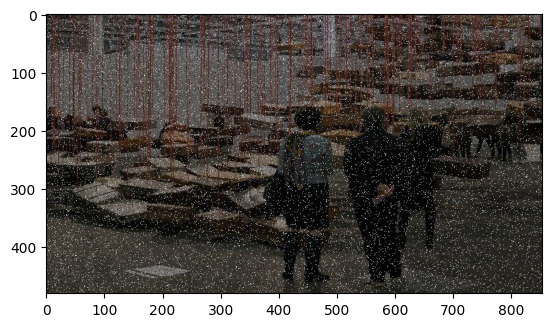

In [20]:
#display image

example_image_path = 'train/images/pexels-photo-112472.jpeg'
display_image(example_image_path, print_info = True, hide_axis = False)

In [21]:
img_properties = get_image_properties(example_image_path)
img_properties

{'width': 854, 'height': 480, 'channels': 3, 'dtype': dtype('uint8')}

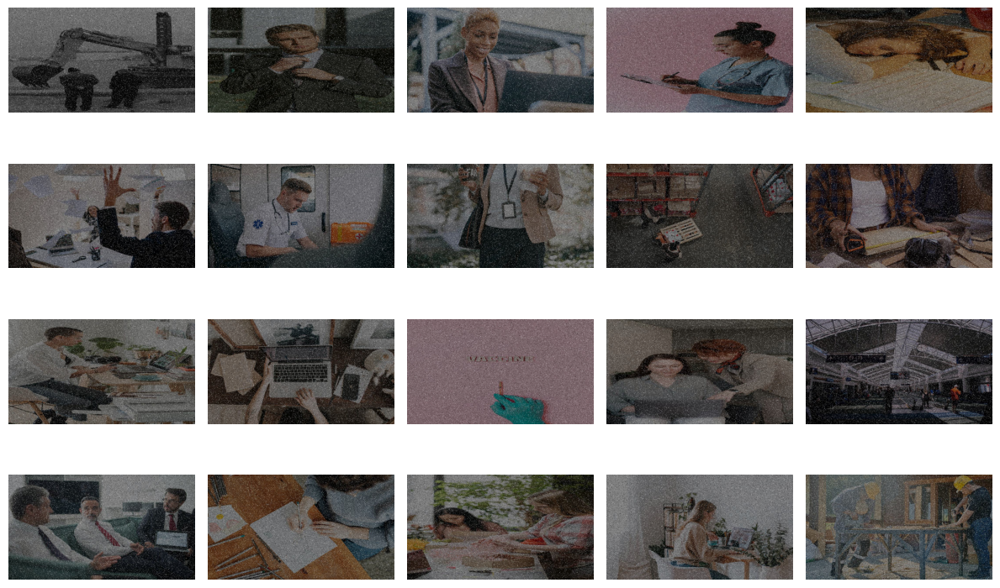

In [ ]:
#display multiple images

folder_path = 'train/images/'
plot_random_images_from_folder(folder_path, num_images=20, seed=CFG.SEED)

In [ ]:
#Dataset Stats
%%time
class_idx = {str(i): CFG.CLASSES[i] for i in range(CFG.NUM_CLASSES_TO_TRAIN)}

class_stat = {}
data_len = {}
class_info = []

for mode in ['train', 'valid', 'test']:
    class_count = {CFG.CLASSES[i]: 0 for i in range(CFG.NUM_CLASSES_TO_TRAIN)}

    path = os.path.join(CFG.DATASET_DIR, mode, 'labels')

    for file in os.listdir(path):
        with open(os.path.join(path, file)) as f:
            lines = f.readlines()

            for cls in set([line[0] for line in lines]):
                class_count[class_idx[cls]] += 1

    data_len[mode] = len(os.listdir(path))
    class_stat[mode] = class_count

    class_info.append({'Mode': mode, **class_count, 'Data_Volume': data_len[mode]})

dataset_stats_df = pd.DataFrame(class_info)
dataset_stats_df

CPU times: user 385 ms, sys: 224 ms, total: 609 ms
Wall time: 1min 2s


,Mode,person,ear,ear-muffs,face,faceguard,face-mask-medical,foot,tool,glasses,gloves,helmet,hand,head,medical-suit,shoes,safety-suit,safety-vest,Data_Volume
0,train,1388,1399,51,1019,20,75,69,407,295,242,0,0,0,0,0,0,0,1460
1,valid,299,298,13,226,6,15,11,79,61,46,0,0,0,0,0,0,0,313
2,test,294,302,9,223,4,13,16,86,80,51,0,0,0,0,0,0,0,313


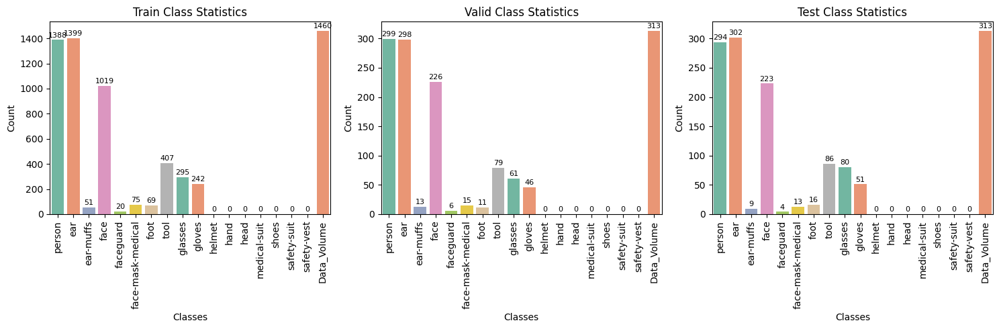

In [ ]:
# Create subplots with 1 row and 3 columns
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Plot vertical bar plots for each mode in subplots
for i, mode in enumerate(['train', 'valid', 'test']):
    sns.barplot(
        data=dataset_stats_df[dataset_stats_df['Mode'] == mode].drop(columns='Mode'),
        orient='v',
        ax=axes[i],
        palette='Set2'
    )

    axes[i].set_title(f'{mode.capitalize()} Class Statistics')
    axes[i].set_xlabel('Classes')
    axes[i].set_ylabel('Count')
    axes[i].tick_params(axis='x', rotation=90)

    # Add annotations on top of each bar
    for p in axes[i].patches:
        axes[i].annotate(f"{int(p.get_height())}", (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha='center', va='center', fontsize=8, color='black', xytext=(0, 5),
                         textcoords='offset points')

plt.tight_layout()
plt.show()

In [ ]:
#Check Image Sizes
%%time

for mode in ['train', 'valid', 'test']:
    print(f'\nImage sizes in {mode} set:')

    img_size = 0
    for file in glob.glob(os.path.join(CFG.DATASET_DIR, mode, 'images', '*')):

        image = Image.open(file)

        if image.size != img_size:
            print(f'{image.size}')
            img_size = image.size
            print('\n')


Image sizes in train set:
(854, 480)



Image sizes in valid set:
(854, 480)



Image sizes in test set:
(854, 480)


CPU times: user 440 ms, sys: 262 ms, total: 703 ms
Wall time: 15.8 s


### Base Model Inference

In [ ]:
#Checking Base Model Inference on Training Dataset
CFG.BASE_MODEL_WEIGHTS

'yolov8s.pt'

In [ ]:
model = YOLO(CFG.BASE_MODEL_WEIGHTS)
model.to('cuda')

results = model.predict(
    source = example_image_path,

    classes = [0],
    conf = 0.30,
    # device = 'cpu',
    device = 'cuda', # inference with dual GPU
    imgsz = (img_properties['height'], img_properties['width']),

    save = True,
    save_txt = True,
    save_conf = True,
    exist_ok = True,
)


WARNING ⚠️ imgsz=[480, 854] must be multiple of max stride 32, updating to [480, 864]
image 1/1 /content/gdrive/MyDrive/capstone_480p/train/images/pexels-photo-112472.jpeg: 480x864 2 persons, 16.2ms
Speed: 9.7ms preprocess, 16.2ms inference, 587.8ms postprocess per image at shape (1, 3, 480, 864)
Results saved to runs/detect/predict
1 label saved to runs/detect/predict/labels


Type:  <class 'PIL.JpegImagePlugin.JpegImageFile'> 

Shape:  (480, 854, 3) 



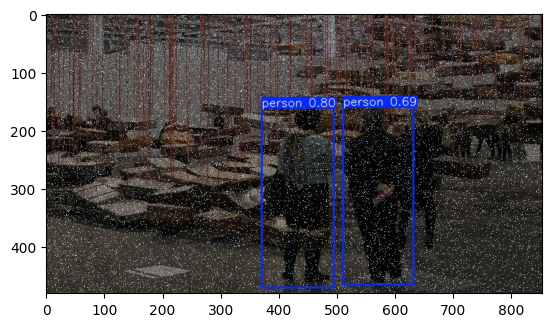

In [ ]:
### check predictions with base model
example_image_inference_output = example_image_path.split('/')[-1]
display_image(f'/content/gdrive/My Drive/capstone_480p/runs/detect/predict/{example_image_inference_output}')

### Model Training

In [17]:
#Model Training
print('Model: ', CFG.BASE_MODEL_WEIGHTS)
print('Epochs: ', CFG.EPOCHS)
print('Batch: ', CFG.BATCH_SIZE)

Model:  yolov8s.pt
Epochs:  10
Batch:  8


In [18]:
# Load pre-trained YOLO model
model = YOLO(CFG.BASE_MODEL_WEIGHTS)

In [22]:
%%time
# Setup
stop_event = threading.Event()
csv_filename = "gpu_log_train_480_L4.csv"
interval = 1.0

# Start GPU logging in the background
gpu_log_thread = threading.Thread(
    target=log_gpu_usage_to_csv,
    args=(stop_event, interval, csv_filename)
)
gpu_log_thread.start()

# Define the path to the data.yaml file
data_yaml_path = '/content/gdrive/MyDrive/capstone_480p/runs/L4/data.yaml'

### train
model.train(
    data = data_yaml_path,  # Update the path here

    task = 'detect',

    imgsz = (img_properties['height'], img_properties['width']),

    epochs = CFG.EPOCHS,
    batch = CFG.BATCH_SIZE,
    optimizer = CFG.OPTIMIZER,
    lr0 = CFG.LR,
    lrf = CFG.LR_FACTOR,
    weight_decay = CFG.WEIGHT_DECAY,
    dropout = CFG.DROPOUT,
    fraction = CFG.FRACTION,
    patience = CFG.PATIENCE,
    profile = CFG.PROFILE,
    label_smoothing = CFG.LABEL_SMOOTHING,

    name = f'{CFG.BASE_MODEL}_{CFG.EXP_NAME}',
    seed = CFG.SEED,

    val = True,
    amp = True,
    exist_ok = True,
    resume = False,
    # device = 'cpu',
    device = 'cuda', # 0
    verbose = False,
)

# Stop logging after model finishes
stop_event.set()
gpu_log_thread.join()


🔍 Logging GPU usage every 1.0s...
WARNING ⚠️ 'label_smoothing' is deprecated and will be removed in in the future.
Ultralytics 8.3.138 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/gdrive/MyDrive/capstone_480p/runs/L4/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=(480, 854), int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov8s

100%|██████████| 755k/755k [00:00<00:00, 23.3MB/s]

Overriding model.yaml nc=80 with nc=17

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytic

Model summary: 129 layers, 11,142,179 parameters, 11,142,163 gradients, 28.7 GFLOPs

Transferred 349/355 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...
AMP: checks passed ✅
WARNING ⚠️ updating to 'imgsz=854'. 'train' and 'val' imgsz must be an integer, while 'predict' and 'export' imgsz may be a [h, w] list or an integer, i.e. 'yolo export imgsz=640,480' or 'yolo export imgsz=640'
WARNING ⚠️ imgsz=[854] must be multiple of max stride 32, updating to [864]
train: Fast image access ✅ (ping: 0.3±0.0 ms, read: 0.4±0.0 MB/s, size: 178.8 KB)


train: Scanning /content/gdrive/My Drive/capstone_480p/train/labels.cache... 1460 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1460/1460 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.3±0.1 ms, read: 0.3±0.0 MB/s, size: 177.5 KB)


val: Scanning /content/gdrive/My Drive/capstone_480p/valid/labels.cache... 313 images, 0 backgrounds, 0 corrupt: 100%|██████████| 313/313 [00:00<?, ?it/s]


Plotting labels to runs/detect/yolov8s_ppe_css_10_epochs_L4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000476, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 864 train, 864 val
Using 8 dataloader workers
Logging results to runs/detect/yolov8s_ppe_css_10_epochs_L4
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      3.74G      1.745      3.048      1.746         30        864: 100%|██████████| 183/183 [00:28<00:00,  6.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  6.01it/s]


                   all        313       2953      0.806      0.155      0.171     0.0907

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      3.98G      1.556      1.922      1.574         49        864: 100%|██████████| 183/183 [00:26<00:00,  6.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:02<00:00,  8.85it/s]

                   all        313       2953      0.648      0.223      0.237      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      4.02G      1.507      1.691      1.512         49        864: 100%|██████████| 183/183 [00:26<00:00,  6.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:02<00:00,  8.83it/s]

                   all        313       2953       0.56      0.249      0.254      0.138



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      4.06G      1.475      1.555      1.486         34        864: 100%|██████████| 183/183 [00:26<00:00,  6.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:02<00:00,  9.15it/s]


                   all        313       2953      0.663      0.276      0.286      0.159

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      4.27G      1.415      1.411      1.446         18        864: 100%|██████████| 183/183 [00:26<00:00,  6.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:02<00:00,  9.11it/s]


                   all        313       2953      0.671      0.257      0.295      0.169

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      4.27G      1.372      1.325      1.406         44        864: 100%|██████████| 183/183 [00:26<00:00,  6.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:02<00:00,  9.10it/s]


                   all        313       2953      0.353      0.309      0.313      0.177

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      4.27G      1.323      1.237       1.37         48        864: 100%|██████████| 183/183 [00:26<00:00,  6.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:02<00:00,  9.13it/s]


                   all        313       2953      0.663      0.304      0.327      0.186

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      4.31G      1.282      1.154      1.336         25        864: 100%|██████████| 183/183 [00:26<00:00,  6.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:02<00:00,  9.15it/s]


                   all        313       2953      0.506      0.335      0.334      0.194

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      4.31G      1.227      1.074      1.303         43        864: 100%|██████████| 183/183 [00:26<00:00,  6.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:02<00:00,  9.16it/s]


                   all        313       2953      0.664      0.319      0.344      0.201

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      4.31G      1.212      1.044      1.284         40        864: 100%|██████████| 183/183 [00:26<00:00,  6.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:02<00:00,  9.29it/s]


                   all        313       2953       0.45      0.343      0.344      0.203

10 epochs completed in 0.089 hours.
Optimizer stripped from runs/detect/yolov8s_ppe_css_10_epochs_L4/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/yolov8s_ppe_css_10_epochs_L4/weights/best.pt, 22.5MB

Validating runs/detect/yolov8s_ppe_css_10_epochs_L4/weights/best.pt...
Ultralytics 8.3.138 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 11,132,163 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  5.79it/s]


                   all        313       2953      0.452      0.343      0.344      0.203
Speed: 0.2ms preprocess, 1.9ms inference, 0.0ms loss, 3.6ms postprocess per image
Results saved to runs/detect/yolov8s_ppe_css_10_epochs_L4
✅ Done logging. Data saved to gpu_log_train_480_L4.csv
CPU times: user 5min 39s, sys: 15.7 s, total: 5min 55s
Wall time: 5min 58s


### Evaluation and Benchmarking

In [23]:
model_path = '/content/gdrive/MyDrive/capstone_480p/runs/detect/yolov8s_ppe_css_10_epochs_L4/weights/best.pt'
data_yaml_path = '/content/gdrive/MyDrive/capstone_480p/runs/L4/data.yaml'
exp_name = 'yolov8s_ppe_css_10_epochs_L4'
imgsz = (img_properties['height'], img_properties['width'])
conf_threshold = 0.15
device = 'cuda'
num_images_to_test = 50
csv_filename = "gpu_log_val_480_L4.csv"

In [24]:
# Setup
stop_event = threading.Event()
csv_filename = "gpu_log_val_480_L4.csv"
interval = 0.2

# Start GPU logging in the background
gpu_log_thread = threading.Thread(
    target=log_gpu_usage_to_csv,
    args=(stop_event, interval, csv_filename)
)
gpu_log_thread.start()

# Start model validation
validate = validate_model(model_path, data_yaml_path, exp_name, imgsz, conf_threshold, device, num_images_to_test)

# Stop logging after model finishes
stop_event.set()
gpu_log_thread.join()

🔍 Logging GPU usage every 0.2s...

✅ Running model validation...
WARNING ⚠️ updating to 'imgsz=854'. 'train' and 'val' imgsz must be an integer, while 'predict' and 'export' imgsz may be a [h, w] list or an integer, i.e. 'yolo export imgsz=640,480' or 'yolo export imgsz=640'
WARNING ⚠️ imgsz=[854] must be multiple of max stride 32, updating to [864]
Ultralytics 8.3.138 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 11,132,163 parameters, 0 gradients, 28.5 GFLOPs
val: Fast image access ✅ (ping: 0.4±0.2 ms, read: 0.4±0.1 MB/s, size: 176.8 KB)


val: Scanning /content/gdrive/My Drive/capstone_480p/test/labels.cache... 313 images, 0 backgrounds, 0 corrupt: 100%|██████████| 313/313 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


                   all        313       2998      0.404      0.336      0.385      0.239
                person        294        506      0.736      0.856      0.883      0.651
                   ear        190        329      0.671      0.605      0.702      0.396
             ear-muffs          9         13          0          0          0          0
                  face        223        368      0.773      0.833      0.878      0.599
             faceguard          4          4          0          0          0          0
     face-mask-medical         13         25      0.519      0.519      0.444      0.185
                  foot         16         34      0.238     0.0588      0.117     0.0441
                  tool         86        216       0.33      0.139      0.213     0.0921
               glasses         80         94      0.532      0.213      0.359      0.163
                gloves         51         99       0.31      0.263      0.253      0.182
                helme

In [25]:
import os
print(os.getcwd())

/content/gdrive/My Drive/capstone_480p


In [26]:
val_result_to_csv(validate,'validate_results_summary_L4.csv','validate_per_class_map_L4.csv','validate_timing_L4.csv','validate_full_results_L4.json')

In [31]:
#display benchmark results
folder_reso = 'capstone_480p'
summary_df_480_t4 = display_benchmark_results('validate_results_summary_L4.csv', 'gpu_log_val_480_L4.csv', 'gpu_log_train_480_L4.csv', 'validate_timing_L4.csv', exp_name,folder_reso)


Training Metrics:
Training Duration (s): 321.4040
Max GPU Memory Usage (MB): 4687.0
Max GPU Utilization (%): 93.0

Validation Metrics:
Precision: 0.4043
Recall: 0.3355
mAP_0.5: 0.3849
mAP_0.5:0.95: 0.2387
Max GPU Memory Usage (MB): 1893.0
Max GPU Utilization (%): 69.0

Inference Duration:
Preprocess(ms): 0.7556
Inference(ms): 4.2173
Postprocess(ms): 3.9288
Total(ms): 8.9017


In [32]:
#save summary_df as output csv
summary_df_480_t4.to_csv('summary_df_480_L4.csv', index=False)

Ground Truth (Labels):


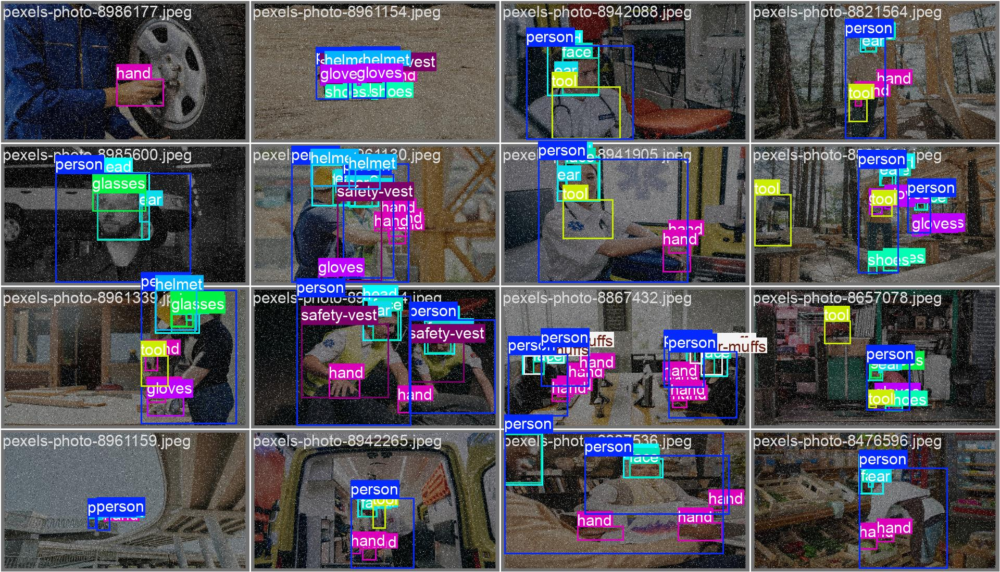


Model Predictions:


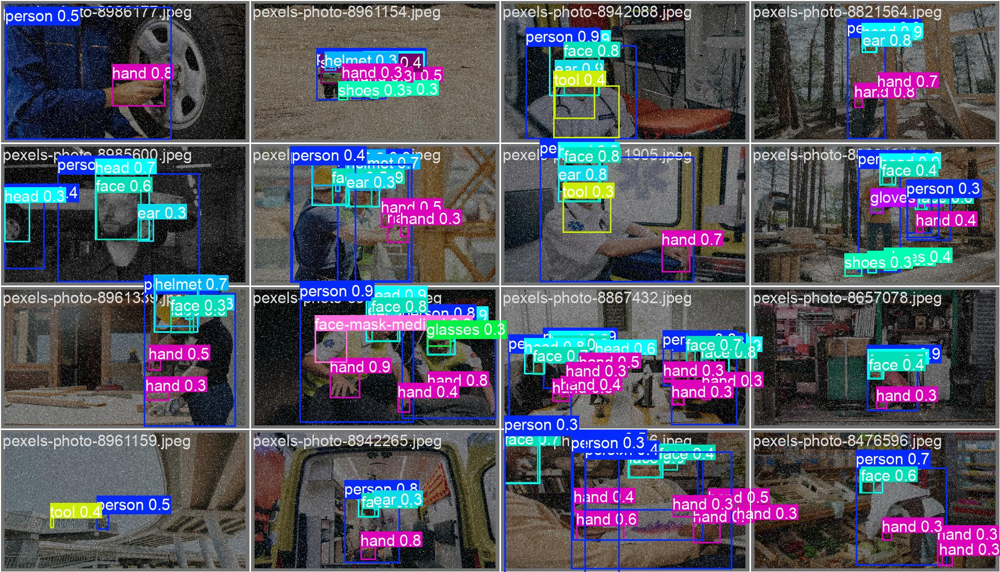

In [ ]:
display_val_comparison(exp_name)


## **1080P**

In [33]:
#Mount Drive

if 'google.colab' in sys.modules:
    # mount google drive
    from google.colab import drive
    drive.mount('/content/gdrive')
    path_to_file = '/content/gdrive/My Drive/capstone_1080p'
    print(path_to_file)
    # move to Google Drive directory
    os.chdir(path_to_file)
    !pwd

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
/content/gdrive/My Drive/capstone_1080p
/content/gdrive/My Drive/capstone_1080p


### Initial Setup and EDA

In [43]:
#Define configuration class to support experimentation and benchmarking

class CFG:
    DEBUG = False
    FRACTION = 0.05 if DEBUG else 1.0
    SEED = 88

    # Dataset
    CLASSES = ['person', 'ear','ear-muffs','face','faceguard','face-mask-medical','foot','tool','glasses','gloves','helmet','hand','head','medical-suit','shoes','safety-suit','safety-vest']

    NUM_CLASSES_TO_TRAIN = len(CLASSES)

    # Training Settings
    EPOCHS = 1 if DEBUG else 10  # Set to 100 for full training
    BATCH_SIZE = 8 #reduced to 5 due to OOM issue during training with T4 (Something to note.)
    IMG_SIZE = 1080  # 1080p resolution
    BASE_MODEL = 'yolov8s'
    BASE_MODEL_WEIGHTS = f'{BASE_MODEL}.pt'
    #EXP_NAME = f'ppe_css_{EPOCHS}_epochs'

    OPTIMIZER = 'auto'
    LR = 1e-3
    WEIGHT_DECAY = 5e-4
    PATIENCE = 20
    DROPOUT = 0.0
    PROFILE = False
    LABEL_SMOOTHING = 0.0
    LR_FACTOR = 0.01

    # GPU Type
    GPU_TYPE = 'L4'  # or 'A100'

    # Experiment Naming
    EXP_NAME = f'ppe_css_{EPOCHS}_epochs_{GPU_TYPE}'
    OUTPUT_DIR = os.path.join('./runs', GPU_TYPE)

    # Paths
    DATASET_DIR = '/content/gdrive/My Drive/capstone_1080p/'  # Change if needed
    #OUTPUT_DIR = './'

    # Inference Settings
    INFERENCE_IMGSZ = 1080
    CONF_THRESHOLD = 0.15
    DEVICE = "cuda"
    NUM_IMAGES_TO_TEST = 50

    # Benchmarking GPUs
    #GPU_TYPES = ["T4", "L4", "A100"]

    # Performance Metrics to Track
    TRACK_INFERENCE_TIME = True
    TRACK_PRECISION_RECALL = True
    TRACK_GPU_UTILIZATION = True
    TRACK_MEMORY_USAGE = True

    # (Optional) Additional settings
    SAVE_INFERENCE_RESULTS = True
    VERBOSE_LOGGING = True


In [36]:
# Creating yaml file

dict_file = {
    'train': os.path.join(CFG.DATASET_DIR, 'train'),
    'val': os.path.join(CFG.DATASET_DIR, 'valid'),
    'test': os.path.join(CFG.DATASET_DIR, 'test'),
    'nc': CFG.NUM_CLASSES_TO_TRAIN,
    'names': CFG.CLASSES
    }

with open(os.path.join(CFG.OUTPUT_DIR, 'data.yaml'), 'w+') as file:
    yaml.dump(dict_file, file)

In [37]:
file_path = os.path.join(CFG.OUTPUT_DIR, 'data.yaml')
yaml_data = read_yaml_file(file_path)

if yaml_data:
    print_yaml_data(yaml_data)

names:
- person
- ear
- ear-muffs
- face
- faceguard
- face-mask-medical
- foot
- tool
- glasses
- gloves
- helmet
- hand
- head
- medical-suit
- shoes
- safety-suit
- safety-vest
nc: 17
test: /content/gdrive/My Drive/capstone_1080p/test
train: /content/gdrive/My Drive/capstone_1080p/train
val: /content/gdrive/My Drive/capstone_1080p/valid



In [38]:
!pwd

/content/gdrive/MyDrive/capstone_1080p


Image shape: (1080, 1920, 3)


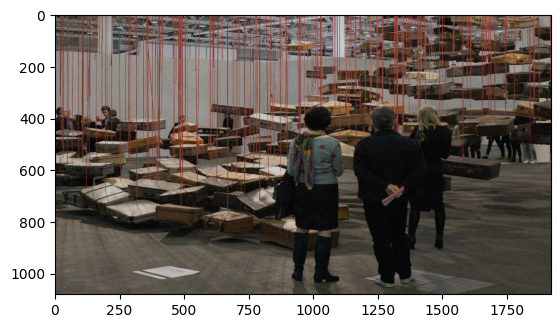

In [39]:
#display image

example_image_path = 'train/images/pexels-photo-112472.jpeg'
display_image(example_image_path, print_info = True, hide_axis = False)

In [40]:
img_properties = get_image_properties(example_image_path)
img_properties

{'width': 1920, 'height': 1080, 'channels': 3, 'dtype': dtype('uint8')}

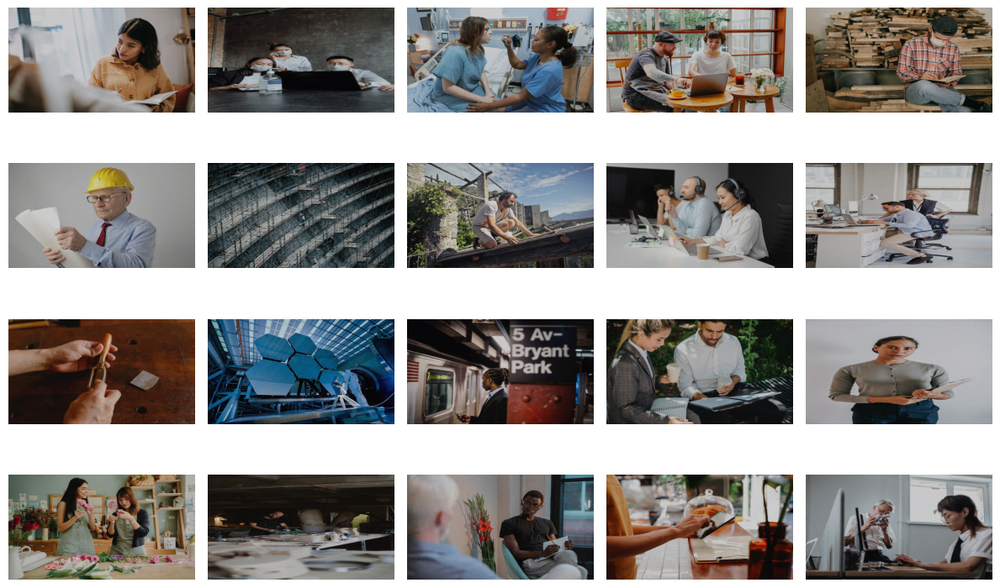

In [ ]:
#display multiple images

folder_path = 'train/images/'
plot_random_images_from_folder(folder_path, num_images=20, seed=CFG.SEED)

In [ ]:
#Dataset Stats
%%time
class_idx = {str(i): CFG.CLASSES[i] for i in range(CFG.NUM_CLASSES_TO_TRAIN)}

class_stat = {}
data_len = {}
class_info = []

for mode in ['train', 'valid', 'test']:
    class_count = {CFG.CLASSES[i]: 0 for i in range(CFG.NUM_CLASSES_TO_TRAIN)}

    path = os.path.join(CFG.DATASET_DIR, mode, 'labels')

    for file in os.listdir(path):
        with open(os.path.join(path, file)) as f:
            lines = f.readlines()

            for cls in set([line[0] for line in lines]):
                class_count[class_idx[cls]] += 1

    data_len[mode] = len(os.listdir(path))
    class_stat[mode] = class_count

    class_info.append({'Mode': mode, **class_count, 'Data_Volume': data_len[mode]})

dataset_stats_df = pd.DataFrame(class_info)
dataset_stats_df

CPU times: user 267 ms, sys: 185 ms, total: 452 ms
Wall time: 11.9 s


,Mode,person,ear,ear-muffs,face,faceguard,face-mask-medical,foot,tool,glasses,gloves,helmet,hand,head,medical-suit,shoes,safety-suit,safety-vest,Data_Volume
0,train,1388,1399,51,1019,20,75,69,407,295,242,0,0,0,0,0,0,0,1460
1,valid,529,523,19,400,9,24,17,152,108,84,0,0,0,0,0,0,0,553
2,test,294,302,9,223,4,13,16,86,80,51,0,0,0,0,0,0,0,313


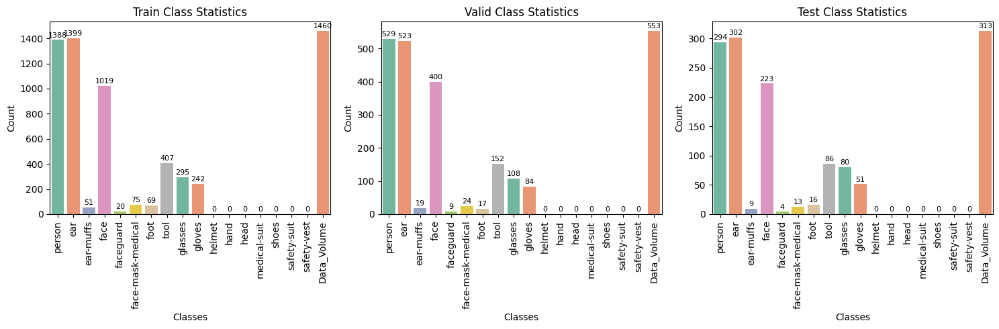

In [ ]:
# Create subplots with 1 row and 3 columns
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Plot vertical bar plots for each mode in subplots
for i, mode in enumerate(['train', 'valid', 'test']):
    sns.barplot(
        data=dataset_stats_df[dataset_stats_df['Mode'] == mode].drop(columns='Mode'),
        orient='v',
        ax=axes[i],
        palette='Set2'
    )

    axes[i].set_title(f'{mode.capitalize()} Class Statistics')
    axes[i].set_xlabel('Classes')
    axes[i].set_ylabel('Count')
    axes[i].tick_params(axis='x', rotation=90)

    # Add annotations on top of each bar
    for p in axes[i].patches:
        axes[i].annotate(f"{int(p.get_height())}", (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha='center', va='center', fontsize=8, color='black', xytext=(0, 5),
                         textcoords='offset points')

plt.tight_layout()
plt.show()

In [ ]:
#Check Image Sizes
%%time

for mode in ['train', 'valid', 'test']:
    print(f'\nImage sizes in {mode} set:')

    img_size = 0
    for file in glob.glob(os.path.join(CFG.DATASET_DIR, mode, 'images', '*')):

        image = Image.open(file)

        if image.size != img_size:
            print(f'{image.size}')
            img_size = image.size
            print('\n')


Image sizes in train set:
(1920, 1080)



Image sizes in valid set:
(1920, 1080)



Image sizes in test set:
(1920, 1080)


CPU times: user 584 ms, sys: 298 ms, total: 882 ms
Wall time: 1min 8s


### Model Training

In [41]:
#Model Training
print('Model: ', CFG.BASE_MODEL_WEIGHTS)
print('Epochs: ', CFG.EPOCHS)
print('Batch: ', CFG.BATCH_SIZE)

Model:  yolov8s.pt
Epochs:  10
Batch:  8


In [42]:
# Load pre-trained YOLO model
model = YOLO(CFG.BASE_MODEL_WEIGHTS)

In [44]:
%%time
# Setup
stop_event = threading.Event()
csv_filename = "gpu_log_train_1080_L4.csv"
interval = 1.0

# Start GPU logging in the background
gpu_log_thread = threading.Thread(
    target=log_gpu_usage_to_csv,
    args=(stop_event, interval, csv_filename)
)
gpu_log_thread.start()

# Define the path to the data.yaml file
data_yaml_path = '/content/gdrive/MyDrive/capstone_1080p/runs/L4/data.yaml'

### train
model.train(
    data = data_yaml_path,  # Update the path here

    task = 'detect',

    imgsz = (img_properties['height'], img_properties['width']),

    epochs = CFG.EPOCHS,
    batch = CFG.BATCH_SIZE,
    optimizer = CFG.OPTIMIZER,
    lr0 = CFG.LR,
    lrf = CFG.LR_FACTOR,
    weight_decay = CFG.WEIGHT_DECAY,
    dropout = CFG.DROPOUT,
    fraction = CFG.FRACTION,
    patience = CFG.PATIENCE,
    profile = CFG.PROFILE,
    label_smoothing = CFG.LABEL_SMOOTHING,

    name = f'{CFG.BASE_MODEL}_{CFG.EXP_NAME}',
    seed = CFG.SEED,

    val = True,
    amp = True,
    exist_ok = True,
    resume = False,
    # device = 'cpu',
    device = 'cuda', # 0
    verbose = False,
)

# Stop logging after model finishes
stop_event.set()
gpu_log_thread.join()


🔍 Logging GPU usage every 1.0s...
New https://pypi.org/project/ultralytics/8.3.139 available 😃 Update with 'pip install -U ultralytics'
WARNING ⚠️ 'label_smoothing' is deprecated and will be removed in in the future.
Ultralytics 8.3.138 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/gdrive/MyDrive/capstone_1080p/runs/L4/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=(1080, 1920), int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=

train: Scanning /content/gdrive/My Drive/capstone_1080p/train/labels.cache... 1460 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1460/1460 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.5±0.2 ms, read: 1.2±0.2 MB/s, size: 536.8 KB)


val: Scanning /content/gdrive/My Drive/capstone_1080p/valid/labels.cache... 315 images, 18 backgrounds, 0 corrupt: 100%|██████████| 333/333 [00:00<?, ?it/s]


Plotting labels to runs/detect/yolov8s_ppe_css_10_epochs_L4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000476, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 1920 train, 1920 val
Using 8 dataloader workers
Logging results to runs/detect/yolov8s_ppe_css_10_epochs_L4
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      17.4G      1.738      4.663      1.884         30       1920: 100%|██████████| 183/183 [02:20<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:07<00:00,  2.77it/s]

                   all        333       2959       0.85      0.173      0.185      0.101



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      16.7G       1.55       2.23      1.657         49       1920: 100%|██████████| 183/183 [02:16<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:07<00:00,  2.82it/s]

                   all        333       2959      0.519      0.214      0.211       0.12



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      17.3G      1.483      1.858      1.605         49       1920: 100%|██████████| 183/183 [02:15<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:07<00:00,  2.84it/s]

                   all        333       2959      0.716      0.253      0.255      0.148



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      17.4G      1.444      1.645      1.561         34       1920: 100%|██████████| 183/183 [02:15<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:07<00:00,  2.85it/s]

                   all        333       2959      0.694      0.292      0.283      0.168



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      16.8G      1.391      1.487      1.513         18       1920: 100%|██████████| 183/183 [02:15<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:07<00:00,  2.85it/s]

                   all        333       2959      0.608      0.284      0.304      0.178



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10        17G      1.339      1.354      1.468         44       1920: 100%|██████████| 183/183 [02:15<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:07<00:00,  2.87it/s]

                   all        333       2959      0.668      0.333      0.331        0.2



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      16.5G      1.301      1.264      1.435         48       1920: 100%|██████████| 183/183 [02:15<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:07<00:00,  2.87it/s]

                   all        333       2959      0.745       0.34      0.351      0.213



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      16.9G      1.251      1.166      1.387         25       1920: 100%|██████████| 183/183 [02:15<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:07<00:00,  2.87it/s]

                   all        333       2959      0.672      0.359      0.371      0.223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      17.4G      1.211      1.066      1.368         43       1920: 100%|██████████| 183/183 [02:15<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:07<00:00,  2.89it/s]

                   all        333       2959      0.664      0.367      0.372      0.229



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      16.7G      1.188      1.037      1.343         41       1920: 100%|██████████| 183/183 [02:15<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:07<00:00,  2.90it/s]

                   all        333       2959      0.677      0.369      0.386      0.239



10 epochs completed in 0.413 hours.
Optimizer stripped from runs/detect/yolov8s_ppe_css_10_epochs_L4/weights/last.pt, 22.7MB
Optimizer stripped from runs/detect/yolov8s_ppe_css_10_epochs_L4/weights/best.pt, 22.7MB

Validating runs/detect/yolov8s_ppe_css_10_epochs_L4/weights/best.pt...
Ultralytics 8.3.138 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 11,132,163 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:07<00:00,  2.63it/s]


                   all        333       2959      0.678      0.368      0.394      0.242
Speed: 0.8ms preprocess, 13.5ms inference, 0.0ms loss, 4.9ms postprocess per image
Results saved to runs/detect/yolov8s_ppe_css_10_epochs_L4
✅ Done logging. Data saved to gpu_log_train_1080_L4.csv
CPU times: user 25min 16s, sys: 1min, total: 26min 17s
Wall time: 25min 14s


### Evaluation and Benchmarking

In [45]:
model_path = '/content/gdrive/MyDrive/capstone_1080p/runs/detect/yolov8s_ppe_css_10_epochs_L4/weights/best.pt'
data_yaml_path = '/content/gdrive/MyDrive/capstone_1080p/runs/L4/data.yaml'
exp_name = 'yolov8s_ppe_css_10_epochs_L4'
imgsz = (img_properties['height'], img_properties['width'])
conf_threshold = 0.15
device = 'cuda'
num_images_to_test = 50
csv_filename = "gpu_log_val_1080_L4.csv"
folder_reso = "capstone_1080p"

In [46]:
# Setup
stop_event = threading.Event()
csv_filename = "gpu_log_val_1080_L4.csv"
interval = 0.2

# Start GPU logging in the background
gpu_log_thread = threading.Thread(
    target=log_gpu_usage_to_csv,
    args=(stop_event, interval, csv_filename)
)
gpu_log_thread.start()

# Start model validation
validate = validate_model(model_path, data_yaml_path, exp_name, imgsz, conf_threshold, device, num_images_to_test)

# Stop logging after model finishes
stop_event.set()
gpu_log_thread.join()

🔍 Logging GPU usage every 0.2s...

✅ Running model validation...
WARNING ⚠️ updating to 'imgsz=1920'. 'train' and 'val' imgsz must be an integer, while 'predict' and 'export' imgsz may be a [h, w] list or an integer, i.e. 'yolo export imgsz=640,480' or 'yolo export imgsz=640'
Ultralytics 8.3.138 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 11,132,163 parameters, 0 gradients, 28.5 GFLOPs
val: Fast image access ✅ (ping: 7.0±14.9 ms, read: 0.7±0.2 MB/s, size: 485.7 KB)


val: Scanning /content/gdrive/My Drive/capstone_1080p/test/labels.cache... 313 images, 0 backgrounds, 0 corrupt: 100%|██████████| 313/313 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


                   all        313       2998      0.509      0.464      0.519      0.303
                person        294        506      0.549      0.822      0.808      0.476
                   ear        190        329      0.734      0.818       0.85      0.587
             ear-muffs          9         13          1     0.0769      0.538     0.0538
                  face        223        368      0.804      0.905       0.93      0.689
             faceguard          4          4          1       0.25      0.625      0.125
     face-mask-medical         13         25       0.63       0.68      0.711      0.384
                  foot         16         34      0.212      0.176      0.137     0.0429
                  tool         86        216      0.236      0.185      0.204     0.0895
               glasses         80         94      0.429      0.559      0.575      0.285
                gloves         51         99      0.247      0.343       0.33      0.247
                helme

In [47]:
import os
print(os.getcwd())

/content/gdrive/My Drive/capstone_1080p


In [48]:
val_result_to_csv(validate,'validate_results_summary_L4.csv','validate_per_class_map_L4.csv','validate_timing_L4.csv','validate_full_results_L4.json')

In [50]:
#display benchmark results
summary_df_1080_t4 = display_benchmark_results('validate_results_summary_L4.csv', 'gpu_log_val_1080_L4.csv', 'gpu_log_train_1080_L4.csv', 'validate_timing_L4.csv', exp_name, folder_reso)


Training Metrics:
Training Duration (s): 1486.8000
Max GPU Memory Usage (MB): 18415.0
Max GPU Utilization (%): 100.0

Validation Metrics:
Precision: 0.5086
Recall: 0.4635
mAP_0.5: 0.5194
mAP_0.5:0.95: 0.3027
Max GPU Memory Usage (MB): 6013.0
Max GPU Utilization (%): 100.0

Inference Duration:
Preprocess(ms): 2.9160
Inference(ms): 24.7311
Postprocess(ms): 1.2384
Total(ms): 28.8854


In [51]:
#save summary_df as output csv
summary_df_1080_t4.to_csv('summary_df_1080_L4.csv', index=False)

Ground Truth (Labels):


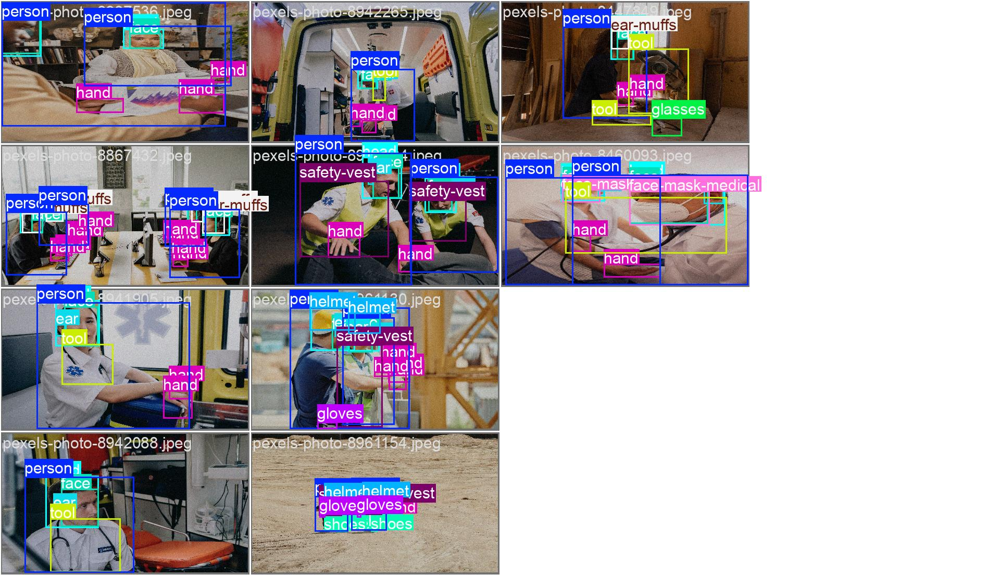


Model Predictions:


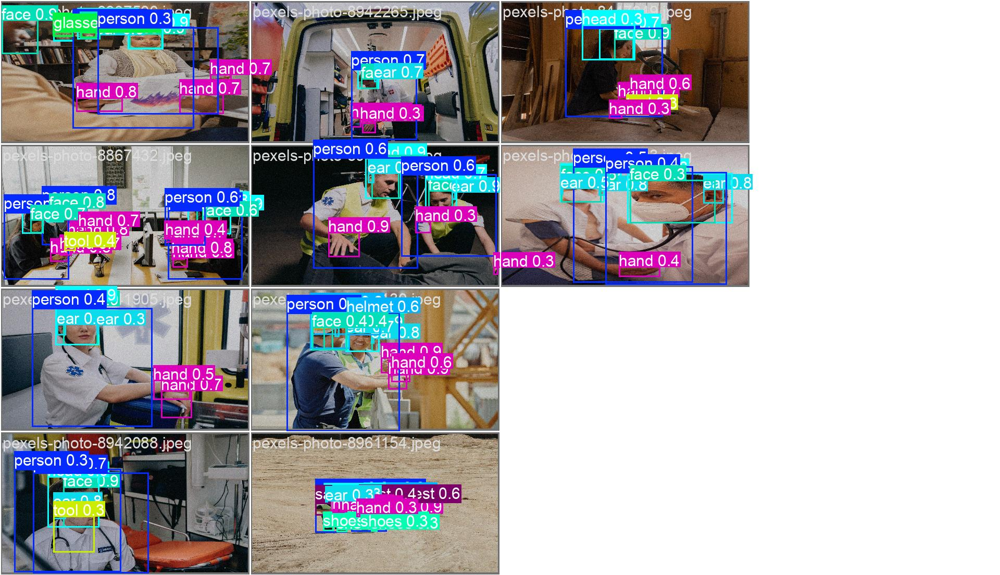

In [ ]:
display_val_comparison(folder_reso,exp_name)


## **720P**

In [52]:
#Mount Drive

if 'google.colab' in sys.modules:
    # mount google drive
    from google.colab import drive
    drive.mount('/content/gdrive')
    path_to_file = '/content/gdrive/My Drive/capstone_720p'
    print(path_to_file)
    # move to Google Drive directory
    os.chdir(path_to_file)
    !pwd

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
/content/gdrive/My Drive/capstone_720p
/content/gdrive/My Drive/capstone_720p


### Initial Setup and EDA

In [53]:
#Define configuration class to support experimentation and benchmarking

class CFG:
    DEBUG = False
    FRACTION = 0.05 if DEBUG else 1.0
    SEED = 88

    # Dataset
    CLASSES = ['person', 'ear','ear-muffs','face','faceguard','face-mask-medical','foot','tool','glasses','gloves','helmet','hand','head','medical-suit','shoes','safety-suit','safety-vest']

    NUM_CLASSES_TO_TRAIN = len(CLASSES)

    # Training Settings
    EPOCHS = 1 if DEBUG else 10  # Set to 100 for full training
    BATCH_SIZE = 8 #reduced to 2 due to OOM issue during training with T4 (Something to note.)
    IMG_SIZE = 1280 # 720p resolution
    BASE_MODEL = 'yolov8s'
    BASE_MODEL_WEIGHTS = f'{BASE_MODEL}.pt'
    #EXP_NAME = f'ppe_css_{EPOCHS}_epochs'

    OPTIMIZER = 'auto'
    LR = 1e-3
    WEIGHT_DECAY = 5e-4
    PATIENCE = 20
    DROPOUT = 0.0
    PROFILE = False
    LABEL_SMOOTHING = 0.0
    LR_FACTOR = 0.01

    # GPU Type
    GPU_TYPE = 'L4'  # or 'A100'

    # Experiment Naming
    EXP_NAME = f'ppe_css_{EPOCHS}_epochs_{GPU_TYPE}'
    OUTPUT_DIR = os.path.join('./runs', GPU_TYPE)

    # Paths
    DATASET_DIR = '/content/gdrive/My Drive/capstone_720p/'  # Change if needed
    OUTPUT_DIR = './'

    # Inference Settings
    INFERENCE_IMGSZ = 1280
    CONF_THRESHOLD = 0.15
    DEVICE = "cuda"
    NUM_IMAGES_TO_TEST = 50

    # Benchmarking GPUs
    #GPU_TYPES = ["T4", "L4", "A100"]

    # Performance Metrics to Track
    TRACK_INFERENCE_TIME = True
    TRACK_PRECISION_RECALL = True
    TRACK_GPU_UTILIZATION = True
    TRACK_MEMORY_USAGE = True

    # (Optional) Additional settings
    SAVE_INFERENCE_RESULTS = True
    VERBOSE_LOGGING = True


In [54]:
# Creating yaml file

dict_file = {
    'train': os.path.join(CFG.DATASET_DIR, 'train'),
    'val': os.path.join(CFG.DATASET_DIR, 'valid'),
    'test': os.path.join(CFG.DATASET_DIR, 'test'),
    'nc': CFG.NUM_CLASSES_TO_TRAIN,
    'names': CFG.CLASSES
    }

with open(os.path.join(CFG.OUTPUT_DIR, 'data.yaml'), 'w+') as file:
    yaml.dump(dict_file, file)

In [55]:
file_path = os.path.join(CFG.OUTPUT_DIR, 'data.yaml')
yaml_data = read_yaml_file(file_path)

if yaml_data:
    print_yaml_data(yaml_data)

names:
- person
- ear
- ear-muffs
- face
- faceguard
- face-mask-medical
- foot
- tool
- glasses
- gloves
- helmet
- hand
- head
- medical-suit
- shoes
- safety-suit
- safety-vest
nc: 17
test: /content/gdrive/My Drive/capstone_720p/test
train: /content/gdrive/My Drive/capstone_720p/train
val: /content/gdrive/My Drive/capstone_720p/valid



In [56]:
!pwd

/content/gdrive/MyDrive/capstone_720p


Image shape: (720, 1280, 3)


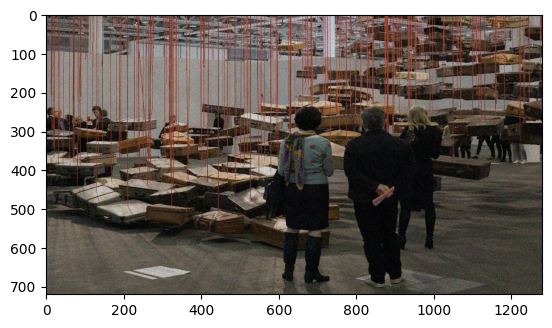

In [57]:
#display image

example_image_path = 'train/images/pexels-photo-112472.jpeg'
display_image(example_image_path, print_info = True, hide_axis = False)

In [58]:
img_properties = get_image_properties(example_image_path)
img_properties

{'width': 1280, 'height': 720, 'channels': 3, 'dtype': dtype('uint8')}

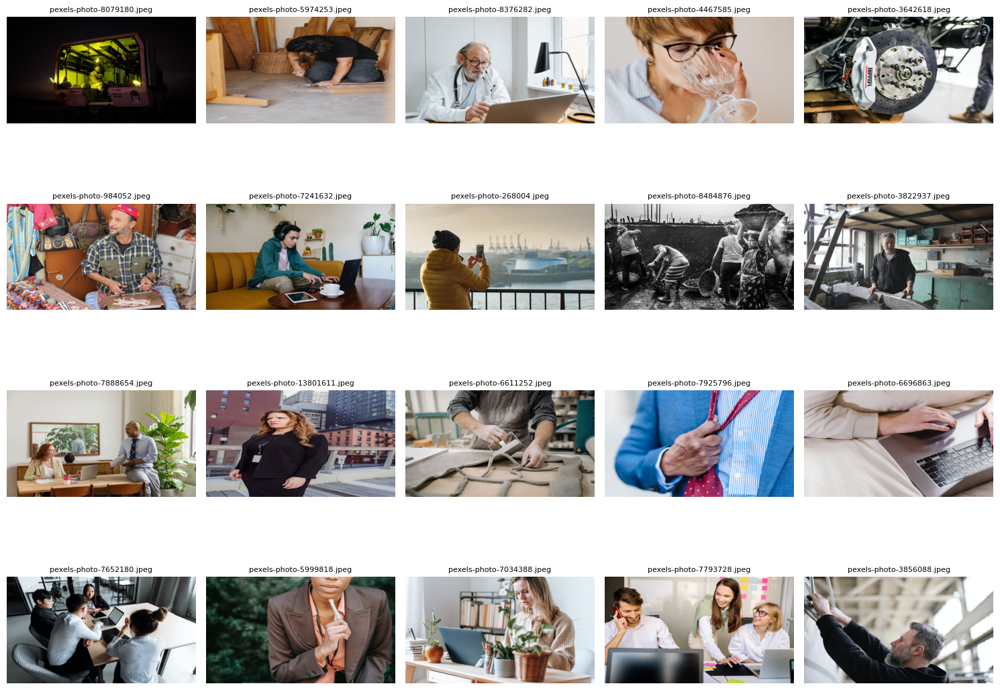

<Figure size 640x480 with 0 Axes>

In [ ]:
#display multiple images

folder_path = 'train/images/'
plot_random_images_from_folder(folder_path, num_images=20, seed=CFG.SEED)

In [ ]:
#Dataset Stats
%%time
class_idx = {str(i): CFG.CLASSES[i] for i in range(CFG.NUM_CLASSES_TO_TRAIN)}

class_stat = {}
data_len = {}
class_info = []

for mode in ['train', 'valid', 'test']:
    class_count = {CFG.CLASSES[i]: 0 for i in range(CFG.NUM_CLASSES_TO_TRAIN)}

    path = os.path.join(CFG.DATASET_DIR, mode, 'labels')

    for file in os.listdir(path):
        with open(os.path.join(path, file)) as f:
            lines = f.readlines()

            for cls in set([line[0] for line in lines]):
                class_count[class_idx[cls]] += 1

    data_len[mode] = len(os.listdir(path))
    class_stat[mode] = class_count

    class_info.append({'Mode': mode, **class_count, 'Data_Volume': data_len[mode]})

dataset_stats_df = pd.DataFrame(class_info)
dataset_stats_df

CPU times: user 210 ms, sys: 203 ms, total: 413 ms
Wall time: 12.7 s


,Mode,person,ear,ear-muffs,face,faceguard,face-mask-medical,foot,tool,glasses,gloves,helmet,hand,head,medical-suit,shoes,safety-suit,safety-vest,Data_Volume
0,train,1388,1399,51,1019,20,75,69,407,295,242,0,0,0,0,0,0,0,1460
1,valid,299,298,13,226,6,15,11,79,61,46,0,0,0,0,0,0,0,313
2,test,294,302,9,223,4,13,16,86,80,51,0,0,0,0,0,0,0,313


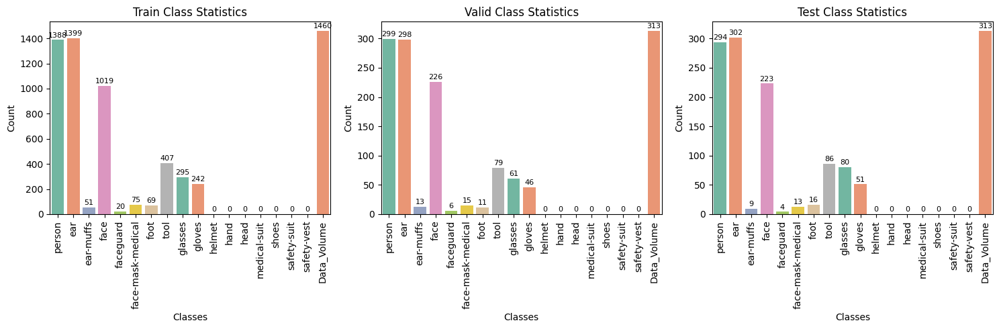

In [ ]:
# Create subplots with 1 row and 3 columns
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Plot vertical bar plots for each mode in subplots
for i, mode in enumerate(['train', 'valid', 'test']):
    sns.barplot(
        data=dataset_stats_df[dataset_stats_df['Mode'] == mode].drop(columns='Mode'),
        orient='v',
        ax=axes[i],
        palette='Set2'
    )

    axes[i].set_title(f'{mode.capitalize()} Class Statistics')
    axes[i].set_xlabel('Classes')
    axes[i].set_ylabel('Count')
    axes[i].tick_params(axis='x', rotation=90)

    # Add annotations on top of each bar
    for p in axes[i].patches:
        axes[i].annotate(f"{int(p.get_height())}", (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha='center', va='center', fontsize=8, color='black', xytext=(0, 5),
                         textcoords='offset points')

plt.tight_layout()
plt.show()

In [ ]:
#Check Image Sizes
%%time

for mode in ['train', 'valid', 'test']:
    print(f'\nImage sizes in {mode} set:')

    img_size = 0
    for file in glob.glob(os.path.join(CFG.DATASET_DIR, mode, 'images', '*')):

        image = PILImage.open(file)

        if image.size != img_size:
            print(f'{image.size}')
            img_size = image.size
            print('\n')


Image sizes in train set:
(1280, 720)



Image sizes in valid set:
(1280, 720)



Image sizes in test set:
(1280, 720)


CPU times: user 425 ms, sys: 302 ms, total: 727 ms
Wall time: 17.4 s


### Model Training

In [59]:
#Model Training
print('Model: ', CFG.BASE_MODEL_WEIGHTS)
print('Epochs: ', CFG.EPOCHS)
print('Batch: ', CFG.BATCH_SIZE)

Model:  yolov8s.pt
Epochs:  10
Batch:  8


In [60]:
# Load pre-trained YOLO model
model = YOLO(CFG.BASE_MODEL_WEIGHTS)

In [ ]:
!pwd

/content/gdrive/MyDrive/capstone_720p


In [65]:
%%time
# Setup
stop_event = threading.Event()
csv_filename = "gpu_log_train_720p_L4.csv"
interval = 1.0

# Start GPU logging in the background
gpu_log_thread = threading.Thread(
    target=log_gpu_usage_to_csv,
    args=(stop_event, interval, csv_filename)
)
gpu_log_thread.start()

# Define the path to the data.yaml file
data_yaml_path = '/content/gdrive/MyDrive/capstone_720p/runs/L4/data.yaml'

### train
model.train(
    data = data_yaml_path,  # Update the path here

    task = 'detect',

    imgsz = (img_properties['height'], img_properties['width']),

    epochs = CFG.EPOCHS,
    batch = CFG.BATCH_SIZE,
    optimizer = CFG.OPTIMIZER,
    lr0 = CFG.LR,
    lrf = CFG.LR_FACTOR,
    weight_decay = CFG.WEIGHT_DECAY,
    dropout = CFG.DROPOUT,
    fraction = CFG.FRACTION,
    patience = CFG.PATIENCE,
    profile = CFG.PROFILE,
    label_smoothing = CFG.LABEL_SMOOTHING,

    name = f'{CFG.BASE_MODEL}_{CFG.EXP_NAME}',
    seed = CFG.SEED,

    val = True,
    amp = True,
    exist_ok = True,
    resume = False,
    # device = 'cpu',
    device = 'cuda', # 0
    verbose = False,
)

# Stop logging after model finishes
stop_event.set()
gpu_log_thread.join()


🔍 Logging GPU usage every 1.0s...
New https://pypi.org/project/ultralytics/8.3.139 available 😃 Update with 'pip install -U ultralytics'
WARNING ⚠️ 'label_smoothing' is deprecated and will be removed in in the future.
Ultralytics 8.3.138 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/gdrive/MyDrive/capstone_720p/runs/L4/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=(720, 1280), int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=30

train: Scanning /content/gdrive/My Drive/capstone_720p/train/labels.cache... 1460 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1460/1460 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 1.1±1.1 ms, read: 59.8±35.5 MB/s, size: 252.7 KB)


val: Scanning /content/gdrive/My Drive/capstone_720p/valid/labels.cache... 313 images, 0 backgrounds, 0 corrupt: 100%|██████████| 313/313 [00:00<?, ?it/s]


Plotting labels to runs/detect/yolov8s_ppe_css_10_epochs_L4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000476, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 1280 train, 1280 val
Using 8 dataloader workers
Logging results to runs/detect/yolov8s_ppe_css_10_epochs_L4
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10       7.6G      1.117     0.9495      1.299         30       1280: 100%|██████████| 183/183 [01:00<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  5.57it/s]

                   all        313       2953      0.674       0.36      0.391      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10       7.6G      1.141      1.008      1.319         49       1280: 100%|██████████| 183/183 [00:58<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  5.73it/s]

                   all        313       2953      0.536      0.357      0.386      0.233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10       7.6G      1.153      1.029      1.327         49       1280: 100%|██████████| 183/183 [00:57<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  5.70it/s]

                   all        313       2953       0.52      0.346      0.371      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      8.07G      1.143     0.9978      1.316         34       1280: 100%|██████████| 183/183 [00:57<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  5.68it/s]

                   all        313       2953      0.575      0.342      0.385      0.229



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      8.09G      1.116     0.9386      1.297         18       1280: 100%|██████████| 183/183 [00:57<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  5.68it/s]

                   all        313       2953      0.385      0.415      0.393      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      8.09G      1.082     0.8884      1.265         44       1280: 100%|██████████| 183/183 [00:57<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  5.70it/s]

                   all        313       2953      0.543      0.372       0.41       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      8.09G      1.064     0.8622      1.255         48       1280: 100%|██████████| 183/183 [00:57<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  5.73it/s]

                   all        313       2953      0.547      0.439      0.431      0.263



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10       8.1G      1.038     0.8045      1.229         25       1280: 100%|██████████| 183/183 [00:58<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  5.75it/s]

                   all        313       2953      0.739      0.383      0.417      0.257



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10       8.1G      1.009     0.7519      1.214         43       1280: 100%|██████████| 183/183 [00:57<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  5.78it/s]

                   all        313       2953      0.529      0.435       0.44       0.27



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10       8.1G      1.013     0.7491      1.212         41       1280: 100%|██████████| 183/183 [00:57<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  5.77it/s]

                   all        313       2953      0.597       0.41      0.433      0.269



10 epochs completed in 0.173 hours.
Optimizer stripped from runs/detect/yolov8s_ppe_css_10_epochs_L4/weights/last.pt, 22.6MB
Optimizer stripped from runs/detect/yolov8s_ppe_css_10_epochs_L4/weights/best.pt, 22.6MB

Validating runs/detect/yolov8s_ppe_css_10_epochs_L4/weights/best.pt...
Ultralytics 8.3.138 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 11,132,163 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.29it/s]


                   all        313       2953      0.528      0.435       0.44       0.27
Speed: 0.4ms preprocess, 5.3ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs/detect/yolov8s_ppe_css_10_epochs_L4
✅ Done logging. Data saved to gpu_log_train_720p_L4.csv
CPU times: user 11min 4s, sys: 25.1 s, total: 11min 29s
Wall time: 10min 40s


### Evaluation and Benchmarking

In [66]:
model_path = '/content/gdrive/MyDrive/capstone_720p/runs/detect/yolov8s_ppe_css_10_epochs_L4/weights/best.pt'
data_yaml_path = '/content/gdrive/MyDrive/capstone_720p/runs/L4/data.yaml'
exp_name = 'yolov8s_ppe_css_10_epochs_L4'
imgsz = (img_properties['height'], img_properties['width'])
conf_threshold = 0.15
device = 'cuda'
num_images_to_test = 50
csv_filename = "gpu_log_val_720p_L4.csv"
folder_reso = "capstone_720p"

In [67]:
# Setup
stop_event = threading.Event()
csv_filename = "gpu_log_val_720p_L4.csv"
interval = 0.2

# Start GPU logging in the background
gpu_log_thread = threading.Thread(
    target=log_gpu_usage_to_csv,
    args=(stop_event, interval, csv_filename)
)
gpu_log_thread.start()

# Start model validation
validate = validate_model(model_path, data_yaml_path, exp_name, imgsz, conf_threshold, device, num_images_to_test)

# Stop logging after model finishes
stop_event.set()
gpu_log_thread.join()

🔍 Logging GPU usage every 0.2s...

✅ Running model validation...
WARNING ⚠️ updating to 'imgsz=1280'. 'train' and 'val' imgsz must be an integer, while 'predict' and 'export' imgsz may be a [h, w] list or an integer, i.e. 'yolo export imgsz=640,480' or 'yolo export imgsz=640'
Ultralytics 8.3.138 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 11,132,163 parameters, 0 gradients, 28.5 GFLOPs
val: Fast image access ✅ (ping: 0.2±0.0 ms, read: 149.5±53.1 MB/s, size: 224.9 KB)


val: Scanning /content/gdrive/My Drive/capstone_720p/test/labels.cache... 313 images, 0 backgrounds, 0 corrupt: 100%|██████████| 313/313 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.87it/s]


                   all        313       2998      0.496      0.421      0.463      0.307
                person        294        506      0.742      0.885      0.894      0.628
                   ear        190        329      0.803      0.733      0.815      0.534
             ear-muffs          9         13      0.513      0.231      0.349      0.165
                  face        223        368      0.874      0.871      0.921      0.679
             faceguard          4          4          0          0          0          0
     face-mask-medical         13         25      0.501      0.562      0.561       0.37
                  foot         16         34        0.5      0.118      0.221      0.122
                  tool         86        216      0.291      0.171      0.218      0.114
               glasses         80         94      0.627      0.457      0.559      0.267
                gloves         51         99      0.377      0.263      0.312      0.222
                helme

In [68]:
import os
print(os.getcwd())

/content/gdrive/MyDrive/capstone_720p


In [69]:
val_result_to_csv(validate,'validate_results_summary_L4.csv','validate_per_class_map_L4.csv','validate_timing_L4.csv','validate_full_results_L4.json')

In [70]:
#display benchmark results
summary_df_720_t4 = display_benchmark_results('validate_results_summary_L4.csv', 'gpu_log_val_720p_L4.csv', 'gpu_log_train_720p_L4.csv', 'validate_timing_L4.csv', exp_name, folder_reso)


Training Metrics:
Training Duration (s): 621.8100
Max GPU Memory Usage (MB): 8595.0
Max GPU Utilization (%): 99.0

Validation Metrics:
Precision: 0.4956
Recall: 0.4212
mAP_0.5: 0.4628
mAP_0.5:0.95: 0.3068
Max GPU Memory Usage (MB): 3027.0
Max GPU Utilization (%): 87.0

Inference Duration:
Preprocess(ms): 1.6341
Inference(ms): 10.1137
Postprocess(ms): 3.5690
Total(ms): 15.3168


In [71]:
#save summary_df as output csv
summary_df_720_t4.to_csv('summary_df_720_L4.csv', index=False)

Ground Truth (Labels):


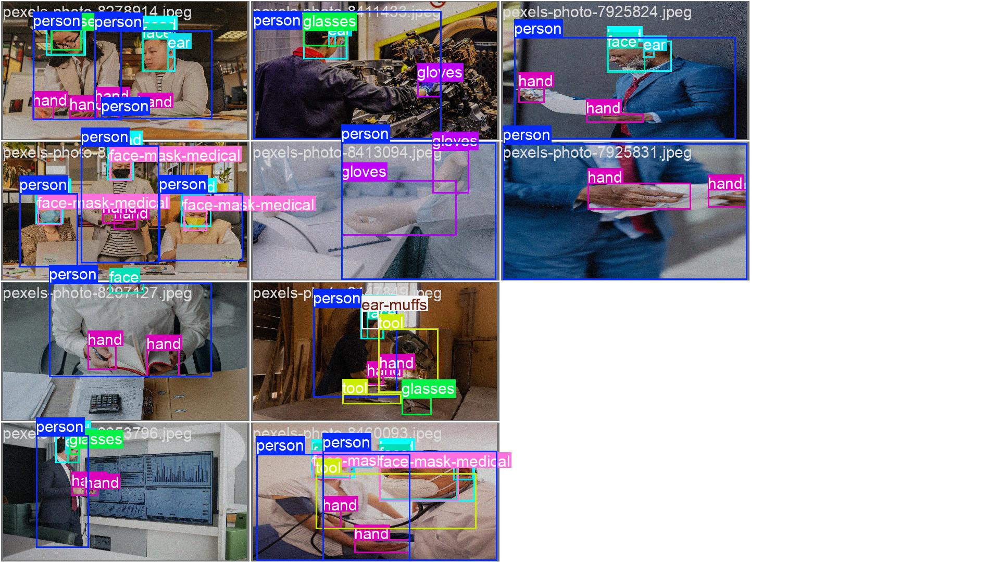


Model Predictions:


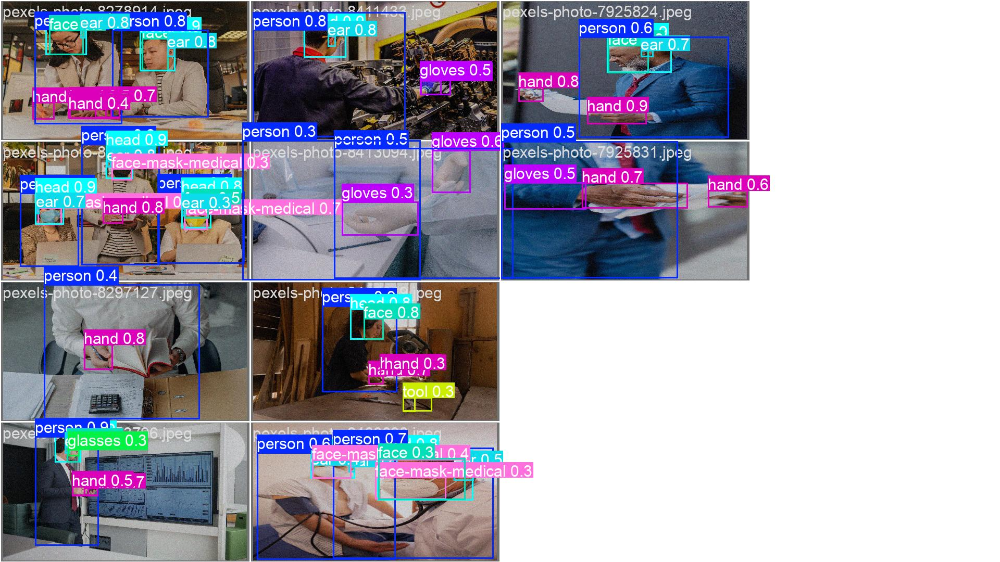

In [ ]:
display_val_comparison(folder_reso,exp_name)


Some notes for evaluation later:
- batch affecting training T4 GPU resources max at 15GB (i have to downsize to 5 for 1080p vs 8 for 480p)
- similarly, 4k was too ambitious and too big for T4's 16 GB VRAM to handle (The NVIDIA T4 GPU, with 16 GB of VRAM, struggles with 4K images because each 4K image consumes a large amount of memory (~95 MB per image for float32 RGB), and deep learning models require additional memory for intermediate feature maps, gradients, and optimizer states. This quickly exceeds available GPU memory, especially with larger batch sizes or deep networks. The error CUBLAS_STATUS_ALLOC_FAILED indicates that CUDA couldn't allocate the needed memory for matrix operations, which often happens when tensor sizes become too large. In contrast, lower resolutions like 720p or 1080p significantly reduce memory load, making them more practical for training and inference on the T4. Additional notes: Thanks for pointing that out! Yes, as mentioned earlier, training with 4K images on a T4 GPU quickly overwhelms memory, especially for models like YOLOv8. Here's the breakdown of why and how to deal with it:

Memory Overload: The T4 GPU has 16 GB of VRAM, but a single 4K image (3840×2160) takes up a significant amount of memory (~95 MB). With models like YOLOv8 that are already resource-hungry due to their deep architecture and large number of parameters, this quickly exceeds the VRAM limits, leading to memory errors.

Why It's a Problem: During training, the model not only stores the image itself but also keeps track of activations, gradients, and other intermediate results. With 4K images, these add up very quickly, and when combined with the depth of modern models, even batch size 1 can easily trigger memory exhaustion.

## **1440P**

In [72]:
#Mount Drive

if 'google.colab' in sys.modules:
    # mount google drive
    from google.colab import drive
    drive.mount('/content/gdrive')
    path_to_file = '/content/gdrive/My Drive/capstone_1440p'
    print(path_to_file)
    # move to Google Drive directory
    os.chdir(path_to_file)
    !pwd

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
/content/gdrive/My Drive/capstone_1440p
/content/gdrive/My Drive/capstone_1440p


### Initial Setup and EDA

In [86]:
#Define configuration class to support experimentation and benchmarking

class CFG:
    DEBUG = False
    FRACTION = 0.05 if DEBUG else 1.0
    SEED = 88

    # Dataset
    CLASSES = ['person', 'ear','ear-muffs','face','faceguard','face-mask-medical','foot','tool','glasses','gloves','helmet','hand','head','medical-suit','shoes','safety-suit','safety-vest']

    NUM_CLASSES_TO_TRAIN = len(CLASSES)

    # Training Settings
    EPOCHS = 1 if DEBUG else 10  # Set to 100 for full training
    BATCH_SIZE = 4 #reduced to 3 due to OOM issue during training with T4 (Something to note.) / reduced to 5 for L4
    IMG_SIZE = 2560 # 1440p resolution
    BASE_MODEL = 'yolov8s'
    BASE_MODEL_WEIGHTS = f'{BASE_MODEL}.pt'
    #EXP_NAME = f'ppe_css_{EPOCHS}_epochs'

    OPTIMIZER = 'auto'
    LR = 1e-3
    WEIGHT_DECAY = 5e-4
    PATIENCE = 20
    DROPOUT = 0.0
    PROFILE = False
    LABEL_SMOOTHING = 0.0
    LR_FACTOR = 0.01

    # GPU Type
    GPU_TYPE = 'L4'  # or 'A100'

    # Experiment Naming
    EXP_NAME = f'ppe_css_{EPOCHS}_epochs_{GPU_TYPE}'
    OUTPUT_DIR = os.path.join('./runs', GPU_TYPE)

    # Paths
    DATASET_DIR = '/content/gdrive/My Drive/capstone_1440p/'  # Change if needed
    #OUTPUT_DIR = './'

    # Inference Settings
    INFERENCE_IMGSZ = 2560
    CONF_THRESHOLD = 0.15
    DEVICE = "cuda"
    NUM_IMAGES_TO_TEST = 50

    # Benchmarking GPUs
    #GPU_TYPES = ["T4", "L4", "A100"]

    # Performance Metrics to Track
    TRACK_INFERENCE_TIME = True
    TRACK_PRECISION_RECALL = True
    TRACK_GPU_UTILIZATION = True
    TRACK_MEMORY_USAGE = True

    # (Optional) Additional settings
    SAVE_INFERENCE_RESULTS = True
    VERBOSE_LOGGING = True


In [74]:
# Creating yaml file

dict_file = {
    'train': os.path.join(CFG.DATASET_DIR, 'train'),
    'val': os.path.join(CFG.DATASET_DIR, 'valid'),
    'test': os.path.join(CFG.DATASET_DIR, 'test'),
    'nc': CFG.NUM_CLASSES_TO_TRAIN,
    'names': CFG.CLASSES
    }

with open(os.path.join(CFG.OUTPUT_DIR, 'data.yaml'), 'w+') as file:
    yaml.dump(dict_file, file)

In [75]:
file_path = os.path.join(CFG.OUTPUT_DIR, 'data.yaml')
yaml_data = read_yaml_file(file_path)

if yaml_data:
    print_yaml_data(yaml_data)

names:
- person
- ear
- ear-muffs
- face
- faceguard
- face-mask-medical
- foot
- tool
- glasses
- gloves
- helmet
- hand
- head
- medical-suit
- shoes
- safety-suit
- safety-vest
nc: 17
test: /content/gdrive/My Drive/capstone_1440p/test
train: /content/gdrive/My Drive/capstone_1440p/train
val: /content/gdrive/My Drive/capstone_1440p/valid



In [76]:
!pwd

/content/gdrive/MyDrive/capstone_1440p


Image shape: (1440, 2560, 3)


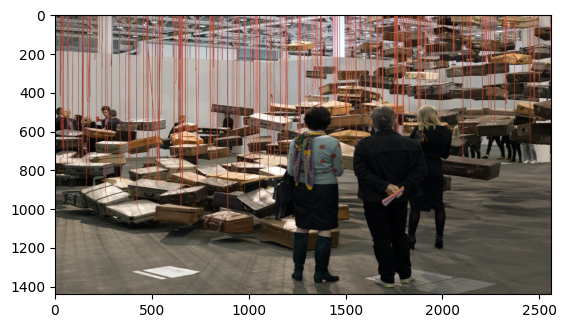

In [77]:
#display image

example_image_path = 'train/images/pexels-photo-112472.jpeg'
display_image(example_image_path, print_info = True, hide_axis = False)

In [78]:
img_properties = get_image_properties(example_image_path)
img_properties

{'width': 2560, 'height': 1440, 'channels': 3, 'dtype': dtype('uint8')}

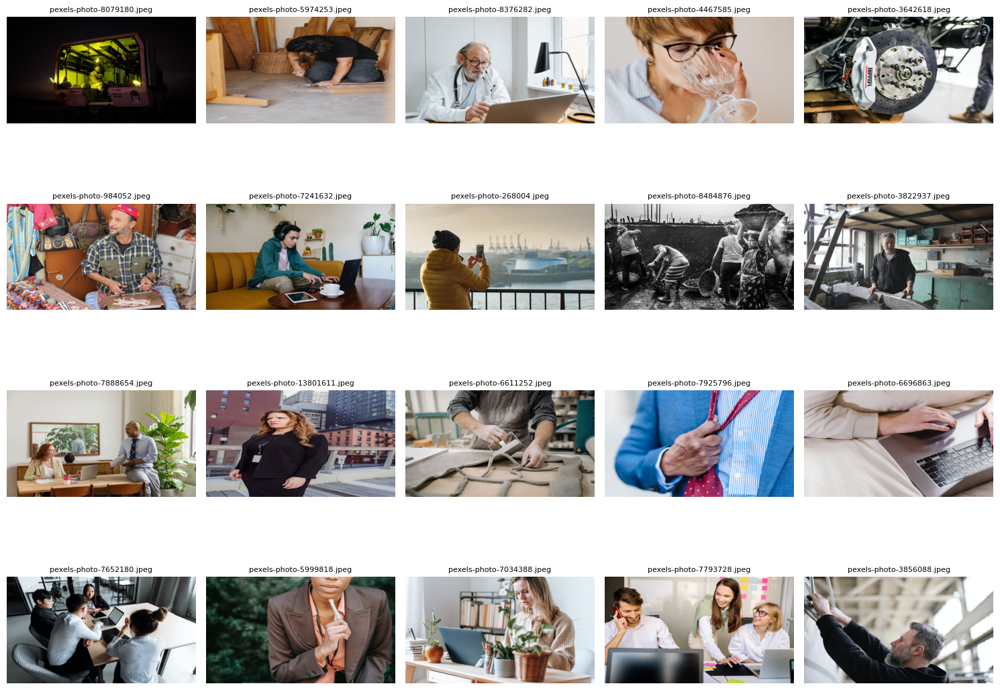

<Figure size 640x480 with 0 Axes>

In [ ]:
#display multiple images

folder_path = 'train/images/'
plot_random_images_from_folder(folder_path, num_images=20, seed=CFG.SEED)

In [ ]:
#Dataset Stats
%%time
class_idx = {str(i): CFG.CLASSES[i] for i in range(CFG.NUM_CLASSES_TO_TRAIN)}

class_stat = {}
data_len = {}
class_info = []

for mode in ['train', 'valid', 'test']:
    class_count = {CFG.CLASSES[i]: 0 for i in range(CFG.NUM_CLASSES_TO_TRAIN)}

    path = os.path.join(CFG.DATASET_DIR, mode, 'labels')

    for file in os.listdir(path):
        with open(os.path.join(path, file)) as f:
            lines = f.readlines()

            for cls in set([line[0] for line in lines]):
                class_count[class_idx[cls]] += 1

    data_len[mode] = len(os.listdir(path))
    class_stat[mode] = class_count

    class_info.append({'Mode': mode, **class_count, 'Data_Volume': data_len[mode]})

dataset_stats_df = pd.DataFrame(class_info)
dataset_stats_df

CPU times: user 356 ms, sys: 198 ms, total: 555 ms
Wall time: 56.3 s


,Mode,person,ear,ear-muffs,face,faceguard,face-mask-medical,foot,tool,glasses,gloves,helmet,hand,head,medical-suit,shoes,safety-suit,safety-vest,Data_Volume
0,train,1388,1399,51,1019,20,75,69,407,295,242,0,0,0,0,0,0,0,1460
1,valid,299,298,13,226,6,15,11,79,61,46,0,0,0,0,0,0,0,313
2,test,294,302,9,223,4,13,16,86,80,51,0,0,0,0,0,0,0,313


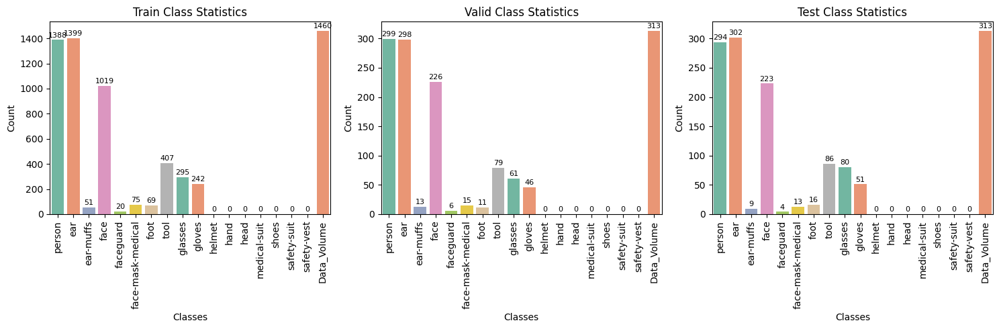

In [ ]:
# Create subplots with 1 row and 3 columns
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Plot vertical bar plots for each mode in subplots
for i, mode in enumerate(['train', 'valid', 'test']):
    sns.barplot(
        data=dataset_stats_df[dataset_stats_df['Mode'] == mode].drop(columns='Mode'),
        orient='v',
        ax=axes[i],
        palette='Set2'
    )

    axes[i].set_title(f'{mode.capitalize()} Class Statistics')
    axes[i].set_xlabel('Classes')
    axes[i].set_ylabel('Count')
    axes[i].tick_params(axis='x', rotation=90)

    # Add annotations on top of each bar
    for p in axes[i].patches:
        axes[i].annotate(f"{int(p.get_height())}", (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha='center', va='center', fontsize=8, color='black', xytext=(0, 5),
                         textcoords='offset points')

plt.tight_layout()
plt.show()

In [ ]:
#Check Image Sizes
%%time

for mode in ['train', 'valid', 'test']:
    print(f'\nImage sizes in {mode} set:')

    img_size = 0
    for file in glob.glob(os.path.join(CFG.DATASET_DIR, mode, 'images', '*')):

        image = PILImage.open(file)

        if image.size != img_size:
            print(f'{image.size}')
            img_size = image.size
            print('\n')


Image sizes in train set:
(2560, 1440)



Image sizes in valid set:
(2560, 1440)



Image sizes in test set:
(2560, 1440)


CPU times: user 516 ms, sys: 335 ms, total: 851 ms
Wall time: 57.8 s


### Model Training

In [87]:
#Model Training
print('Model: ', CFG.BASE_MODEL_WEIGHTS)
print('Epochs: ', CFG.EPOCHS)
print('Batch: ', CFG.BATCH_SIZE)

Model:  yolov8s.pt
Epochs:  10
Batch:  4


In [88]:
# Load pre-trained YOLO model
model = YOLO(CFG.BASE_MODEL_WEIGHTS)

In [ ]:
!pwd

/content/gdrive/MyDrive/capstone_1440p


In [89]:
%%time
# Setup
stop_event = threading.Event()
csv_filename = "gpu_log_train_1440p_L4.csv"
interval = 1.0

# Start GPU logging in the background
gpu_log_thread = threading.Thread(
    target=log_gpu_usage_to_csv,
    args=(stop_event, interval, csv_filename)
)
gpu_log_thread.start()

# Define the path to the data.yaml file
data_yaml_path = '/content/gdrive/MyDrive/capstone_1440p/runs/L4/data.yaml'

### train
model.train(
    data = data_yaml_path,  # Update the path here

    task = 'detect',

    imgsz = (img_properties['height'], img_properties['width']),

    epochs = CFG.EPOCHS,
    batch = CFG.BATCH_SIZE,
    optimizer = CFG.OPTIMIZER,
    lr0 = CFG.LR,
    lrf = CFG.LR_FACTOR,
    weight_decay = CFG.WEIGHT_DECAY,
    dropout = CFG.DROPOUT,
    fraction = CFG.FRACTION,
    patience = CFG.PATIENCE,
    profile = CFG.PROFILE,
    label_smoothing = CFG.LABEL_SMOOTHING,

    name = f'{CFG.BASE_MODEL}_{CFG.EXP_NAME}',
    seed = CFG.SEED,

    val = True,
    amp = True,
    exist_ok = True,
    resume = False,
    # device = 'cpu',
    device = 'cuda', # 0
    verbose = False,
)

# Stop logging after model finishes
stop_event.set()
gpu_log_thread.join()


🔍 Logging GPU usage every 1.0s...
New https://pypi.org/project/ultralytics/8.3.139 available 😃 Update with 'pip install -U ultralytics'
WARNING ⚠️ 'label_smoothing' is deprecated and will be removed in in the future.
Ultralytics 8.3.138 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/gdrive/MyDrive/capstone_1440p/runs/L4/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=(1440, 2560), int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=

train: Scanning /content/gdrive/My Drive/capstone_1440p/train/labels.cache... 1460 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1460/1460 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


WARNING ⚠️ val: Slow image access detected (ping: 14.6±29.1 ms, read: 136.9±132.5 MB/s, size: 691.0 KB). Use local storage instead of remote/mounted storage for better performance. See https://docs.ultralytics.com/guides/model-training-tips/


val: Scanning /content/gdrive/My Drive/capstone_1440p/valid/labels.cache... 313 images, 0 backgrounds, 0 corrupt: 100%|██████████| 313/313 [00:00<?, ?it/s]


Plotting labels to runs/detect/yolov8s_ppe_css_10_epochs_L4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000476, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 2560 train, 2560 val
Using 8 dataloader workers
Logging results to runs/detect/yolov8s_ppe_css_10_epochs_L4
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      21.5G      1.797      6.008      1.955         29       2560: 100%|██████████| 365/365 [07:38<00:00,  1.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:15<00:00,  2.58it/s]

                   all        313       2953      0.785      0.195       0.21      0.119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10        15G      1.605      2.534      1.704         49       2560: 100%|██████████| 365/365 [03:59<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:11<00:00,  3.62it/s]

                   all        313       2953      0.725      0.205      0.253      0.148



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      15.7G      1.571      2.035      1.663         49       2560: 100%|██████████| 365/365 [03:59<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:10<00:00,  3.64it/s]

                   all        313       2953      0.556      0.247       0.27      0.161



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      14.4G      1.518      1.764      1.618         34       2560: 100%|██████████| 365/365 [03:59<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:11<00:00,  3.63it/s]

                   all        313       2953      0.574       0.28      0.299      0.176



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      14.9G      1.474      1.646      1.575         19       2560: 100%|██████████| 365/365 [03:59<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:11<00:00,  3.63it/s]

                   all        313       2953      0.691      0.288      0.323      0.188



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      15.8G      1.419      1.491      1.529         48       2560: 100%|██████████| 365/365 [03:59<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:10<00:00,  3.67it/s]

                   all        313       2953      0.669      0.322      0.349      0.206



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      15.1G      1.382      1.388      1.503         48       2560: 100%|██████████| 365/365 [03:59<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:10<00:00,  3.67it/s]

                   all        313       2953      0.609      0.368      0.362      0.222



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      15.2G      1.332       1.27       1.45         25       2560: 100%|██████████| 365/365 [03:59<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:10<00:00,  3.67it/s]

                   all        313       2953      0.631      0.351      0.386      0.233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10        15G      1.286      1.181      1.418         43       2560: 100%|██████████| 365/365 [03:59<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:10<00:00,  3.68it/s]

                   all        313       2953      0.713      0.363      0.395       0.24



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10        15G      1.262      1.129      1.389         42       2560: 100%|██████████| 365/365 [03:59<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:10<00:00,  3.67it/s]

                   all        313       2953      0.576      0.408      0.413      0.252



10 epochs completed in 0.770 hours.
Optimizer stripped from runs/detect/yolov8s_ppe_css_10_epochs_L4/weights/last.pt, 22.9MB
Optimizer stripped from runs/detect/yolov8s_ppe_css_10_epochs_L4/weights/best.pt, 22.9MB

Validating runs/detect/yolov8s_ppe_css_10_epochs_L4/weights/best.pt...
Ultralytics 8.3.138 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 11,132,163 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:10<00:00,  3.91it/s]


                   all        313       2953      0.576      0.409      0.413      0.252
Speed: 1.4ms preprocess, 23.1ms inference, 0.0ms loss, 2.8ms postprocess per image
Results saved to runs/detect/yolov8s_ppe_css_10_epochs_L4
✅ Done logging. Data saved to gpu_log_train_1440p_L4.csv
CPU times: user 45min 10s, sys: 1min 51s, total: 47min 2s
Wall time: 46min 57s


### Evaluation and Benchmarking

In [90]:
model_path = '/content/gdrive/MyDrive/capstone_1440p/runs/detect/yolov8s_ppe_css_10_epochs_L4/weights/best.pt'
data_yaml_path = '/content/gdrive/MyDrive/capstone_1440p/runs/L4/data.yaml'
exp_name = 'yolov8s_ppe_css_10_epochs_L4'
imgsz = (img_properties['height'], img_properties['width'])
conf_threshold = 0.15
device = 'cuda'
num_images_to_test = 50
csv_filename = "gpu_log_val_1440p_L4.csv"
folder_reso = "capstone_1440p"

In [91]:
# Setup
stop_event = threading.Event()
csv_filename = "gpu_log_val_1440p_L4.csv"
interval = 0.2

# Start GPU logging in the background
gpu_log_thread = threading.Thread(
    target=log_gpu_usage_to_csv,
    args=(stop_event, interval, csv_filename)
)
gpu_log_thread.start()

# Start model validation
validate = validate_model(model_path, data_yaml_path, exp_name, imgsz, conf_threshold, device, num_images_to_test)

# Stop logging after model finishes
stop_event.set()
gpu_log_thread.join()

🔍 Logging GPU usage every 0.2s...

✅ Running model validation...
WARNING ⚠️ updating to 'imgsz=2560'. 'train' and 'val' imgsz must be an integer, while 'predict' and 'export' imgsz may be a [h, w] list or an integer, i.e. 'yolo export imgsz=640,480' or 'yolo export imgsz=640'
Ultralytics 8.3.138 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 11,132,163 parameters, 0 gradients, 28.5 GFLOPs
val: Fast image access ✅ (ping: 0.3±0.1 ms, read: 0.8±0.2 MB/s, size: 495.9 KB)


val: Scanning /content/gdrive/My Drive/capstone_1440p/test/labels.cache... 313 images, 0 backgrounds, 0 corrupt: 100%|██████████| 313/313 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   5%|▌         | 1/20 [00:05<01:43,  5.43s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:35<00:00,  1.78s/it]


                   all        313       2998      0.546      0.378      0.437      0.287
                person        294        506      0.659      0.593      0.649      0.338
                   ear        190        329      0.859      0.802      0.872      0.597
             ear-muffs          9         13          0          0          0          0
                  face        223        368      0.898      0.872      0.932      0.693
             faceguard          4          4          0          0          0          0
     face-mask-medical         13         25      0.699      0.557      0.609      0.357
                  foot         16         34      0.171     0.0294     0.0695     0.0209
                  tool         86        216      0.377     0.0787      0.148     0.0801
               glasses         80         94      0.662       0.48      0.578      0.298
                gloves         51         99      0.571      0.354      0.449      0.331
                helme

In [92]:
import os
print(os.getcwd())

/content/gdrive/MyDrive/capstone_1440p


In [93]:
val_result_to_csv(validate,'validate_results_summary_L4.csv','validate_per_class_map_L4.csv','validate_timing_L4.csv','validate_full_results_L4.json')

In [94]:
#display benchmark results
summary_df_1440_t4 = display_benchmark_results('validate_results_summary_L4.csv', 'gpu_log_val_1440p_L4.csv', 'gpu_log_train_1440p_L4.csv', 'validate_timing_L4.csv', exp_name, folder_reso)


Training Metrics:
Training Duration (s): 2770.6200
Max GPU Memory Usage (MB): 22409.0
Max GPU Utilization (%): 100.0

Validation Metrics:
Precision: 0.5456
Recall: 0.3777
mAP_0.5: 0.4366
mAP_0.5:0.95: 0.2872
Max GPU Memory Usage (MB): 13041.0
Max GPU Utilization (%): 100.0

Inference Duration:
Preprocess(ms): 9.1224
Inference(ms): 45.3659
Postprocess(ms): 19.9427
Total(ms): 74.4309


In [95]:
#save summary_df as output csv
summary_df_1440_t4.to_csv('summary_df_1440_L4.csv', index=False)

Ground Truth (Labels):


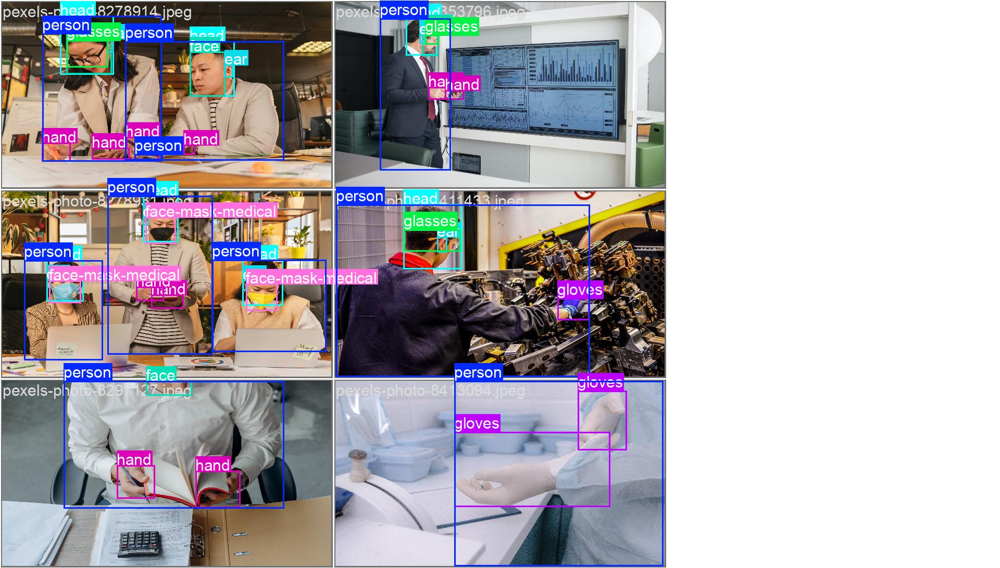


Model Predictions:


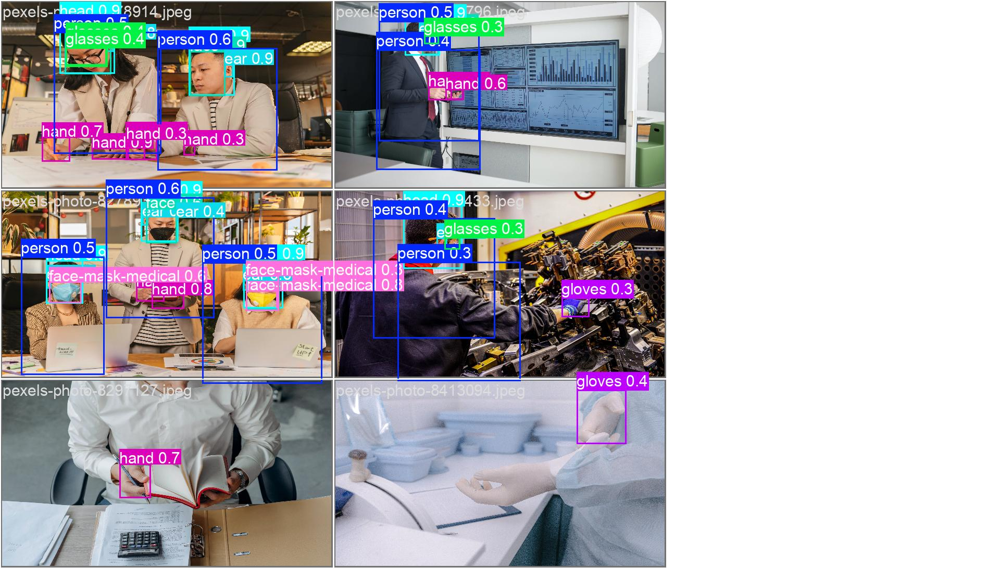

In [ ]:
display_val_comparison(folder_reso,exp_name)


Some notes for evaluation later:
- batch affecting training T4 GPU resources max at 15GB (i have to downsize to 5 for 1080p vs 8 for 480p)
- similarly, 4k was too ambitious and too big for T4's 16 GB VRAM to handle (The NVIDIA T4 GPU, with 16 GB of VRAM, struggles with 4K images because each 4K image consumes a large amount of memory (~95 MB per image for float32 RGB), and deep learning models require additional memory for intermediate feature maps, gradients, and optimizer states. This quickly exceeds available GPU memory, especially with larger batch sizes or deep networks. The error CUBLAS_STATUS_ALLOC_FAILED indicates that CUDA couldn't allocate the needed memory for matrix operations, which often happens when tensor sizes become too large. In contrast, lower resolutions like 720p or 1080p significantly reduce memory load, making them more practical for training and inference on the T4. Additional notes: Thanks for pointing that out! Yes, as mentioned earlier, training with 4K images on a T4 GPU quickly overwhelms memory, especially for models like YOLOv8. Here's the breakdown of why and how to deal with it:

Memory Overload: The T4 GPU has 16 GB of VRAM, but a single 4K image (3840×2160) takes up a significant amount of memory (~95 MB). With models like YOLOv8 that are already resource-hungry due to their deep architecture and large number of parameters, this quickly exceeds the VRAM limits, leading to memory errors.

Why It's a Problem: During training, the model not only stores the image itself but also keeps track of activations, gradients, and other intermediate results. With 4K images, these add up very quickly, and when combined with the depth of modern models, even batch size 1 can easily trigger memory exhaustion.